In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import sctk as sk
import matplotlib.pyplot as plt
import os
import sys
import scipy
import matplotlib
from matplotlib import rcParams
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all" # to show output from all the lines in a cells
pd.set_option('display.max_column',None) # display all the columns in pandas
pd.options.display.max_rows = 100
rcParams['pdf.fonttype'] = 42
sc.settings.figdir = './figures/HC_analysis/'
sc.settings.set_figure_params(dpi = 150, color_map = 'RdPu', dpi_save = 600, vector_friendly = True, format = 'pdf')

In [2]:
def Barplot(which_var, adata, var='clusters', height=3, color = False):
    plotdata = pd.crosstab(adata.obs[var], adata.obs[which_var], normalize='index') * 100
    if 'category' in plotdata.index.dtype.name:
        plotdata.index.reorder_categories(adata.obs[var].cat.categories[::-1])

    if not color:
        ax1 = plotdata.plot.barh(stacked = True, edgecolor = 'none', zorder = 3, figsize = (6,height), fontsize = 14, grid = False)
    else:
        ax1 = plotdata.plot.barh(stacked = True, edgecolor = 'none', zorder = 3, figsize = (6,height), fontsize = 14, grid = False, color = color)
    ax1.set_title(which_var+' %')
    ax1.set_ylabel(var)
    horiz_offset = 1
    vert_offset = 1.
    ax1 = ax1.legend(bbox_to_anchor = (horiz_offset, vert_offset))
#     ax1.figure.savefig(str(sc.settings.figdir)+'/barplot_'+var+'_proportions_'+which_var+'.pdf', bbox_inches='tight',
#                        dpi=300, orientation='landscape', format= 'pdf', optimize=True)

In [3]:
cd F:\PROJECTS\PROJECT_HUMAN_FETAL_COCHLEAE\WORKPLACE\R\sc_pipeline\

F:\PROJECTS\PROJECT_HUMAN_FETAL_COCHLEAE\WORKPLACE\R\sc_pipeline


In [4]:
data_dir = '/PROJECTS/PROJECT_HUMAN_FETAL_COCHLEAE/WORKPLACE/R/sc_pipeline/'
meta = pd.read_csv(data_dir+'metadata_v2.csv',index_col=0)
meta

,sample_id,sample_id2,donor,gw,gender,10xKit,sequencing,dataset
sample,,,,,,,,
9.5gw,gw9,gw9,not_provided_1,9,female,SC3,snRNA-seq,public
11.2gw,gw11,gw11,not_provided_2,11,male,SC3,snRNA-seq,public
14+3gw,gw14,gw14,F20240701,14,male,SC3,snRNA-seq,in-house
15gw,gw15,gw15,not_provided_3,15,female,SC3,scRNA-seq,public
16+4gw,gw16,gw16,F20241018,16,male,SC3,snRNA-seq,in-house
17+2gw,gw17_1,gw17_1,F20220807,17,male,SC3,snRNA-seq,in-house
17+3gw,gw17_2,gw17_2,F20240928,17,female,SC3,snRNA-seq,in-house
17gw,gw17_3,gw17_3,not_provided_4,17,male,SC3,scRNA-seq,public
18+3gw,gw18,gw18,F20220806,18,male,SC3,snRNA-seq,in-house


In [5]:
adata=sc.read('human_coe_sub_for_trajectory_analysis_v4.h5ad')
adata

AnnData object with n_obs × n_vars = 2388 × 13994
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'leiden_R', 'low_ncounts', 'high_mito', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'leiden_res1.0', 'is_doublet_scrub', 'leiden_res1.1', 'leiden_res4.0', 'leiden_res2.0', '_scvi_batch', '_scvi_labels', 'leiden_scanvi_2.0', 'leiden_scanvi_3.0', 'leiden_scanvi_4.0', 'cell_type_final', 'cell_type_final_v2', 'scANVI_res2.0', 'cell_type_final_v4'
    var: 'Gene', 'mt', 'gene_ids-0', 'feature_types-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 

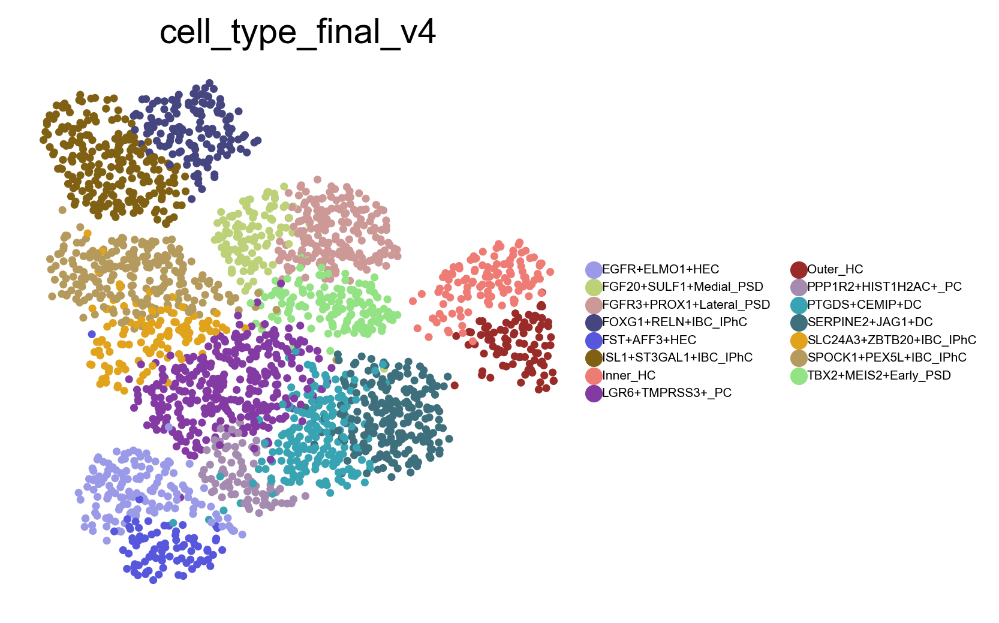

In [6]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.umap(
    adata,legend_fontsize=5,color="cell_type_final_v4",size=40,   )#legend_loc='on data',

In [7]:
cluster_annotation = {
 'FGF20+SULF1+Medial_PSD': 'FGFR3+PROX1+Lateral_PSD',
     'TBX2+MEIS2+Early_PSD': 'TBX2+MEIS2+Early_PSD',
     'FGFR3+PROX1+Lateral_PSD': 'FGF20+SULF1+Medial_PSD',
    
     'Outer_HC': 'Outer_HC',
     'Inner_HC': 'Inner_HC',
    
     'LGR6+TMPRSS3+_PC': 'LGR6+TMPRSS3+_PC',
    
    'LGR6+TMPRSS3+_PC': 'LGR6+TMPRSS3+_PC',
   
    'PPP1R2+HIST1H2AC+_PC': 'PPP1R2+HIST1H2AC+_PC',
    
     'ISL1+ST3GAL1+IBC_IPhC': 'ISL1+ST3GAL1+IBC_IPhC',
    'FOXG1+RELN+IBC_IPhC': 'FOXG1+RELN+IBC_IPhC',
     'SPOCK1+PEX5L+IBC_IPhC': 'SPOCK1+PEX5L+IBC_IPhC',
    'SLC24A3+ZBTB20+IBC_IPhC': 'SLC24A3+ZBTB20+IBC_IPhC',
    
     'SERPINE2+JAG1+DC': 'SERPINE2+JAG1+DC',
    'PTGDS+CEMIP+DC': 'PTGDS+CEMIP+DC',
    
     'EGFR+ELMO1+HEC': 'EGFR+ELMO1+HEC',
    'FST+AFF3+HEC': 'FST+AFF3+HEC',

}
adata.obs['cell_type_final_v4'] = adata.obs['cell_type_final_v4'].map(cluster_annotation).astype('category')

In [8]:
holder = []
for sample in meta.index:
    print(sample)
    # Load 10x data as AnnData
    #adata_sample = sc.read_10x_mtx(data_dir+'rawdata_pbx3_neo/'+sample+'/outs/filtered_feature_bc_matrix/',cache=True)
    holder.append(sc.read(data_dir+sample+'/human_gw_raw.h5ad',cache=True)) 
    # Set names of observation as sample + _ + barcode/probe
    holder[-1].obs_names = [sample+'_'+i.split('-')[0] for i in holder[-1].obs_names]
    # Filer genes expressed in less than 3 cells
    sc.pp.filter_genes(holder[-1], min_cells=3)
    # Filer cells with less than 10 genes expressed
    sc.pp.filter_cells(holder[-1], min_genes=10)
    # add in metadata
    holder[-1].obs['sample'] = sample
    for val in meta.columns:
        holder[-1].obs[val] = meta[val][sample]
    # Extract mitochondial genes
    mito_genes = [name for name in holder[-1].var_names if name.startswith('MT-')]
    #for each cell compute fraction of counts in mito genes vs. all genes
    #the `.A1` is only necessary, as X is sparse - it transform to a dense array after summing
    holder[-1].obs['percent_mito'] = np.sum(
        holder[-1][:, mito_genes].X, axis=1).A1 / np.sum(holder[-1].X, axis=1).A1
    #add the total counts per cell as observations-annotation to adata
    holder[-1].obs['n_counts'] = holder[-1].X.sum(axis=1).A1
    print('Total number of cells: {:d}'.format(holder[-1].n_obs))
    print('Total number of genes: {:d}'.format(holder[-1].n_vars))

9.5gw
Total number of cells: 4284
Total number of genes: 22512
11.2gw
Total number of cells: 4051
Total number of genes: 26703
14+3gw
Total number of cells: 12081
Total number of genes: 29961
15gw
Total number of cells: 2146
Total number of genes: 18995
16+4gw
Total number of cells: 8708
Total number of genes: 29950
17+2gw
Total number of cells: 6773
Total number of genes: 26118
17+3gw
Total number of cells: 7148
Total number of genes: 26633
17gw
Total number of cells: 4538
Total number of genes: 19729
18+3gw
Total number of cells: 9595
Total number of genes: 26884
20gw
Total number of cells: 3833
Total number of genes: 26808
22+2gw_1
Total number of cells: 5837
Total number of genes: 28742
22+2gw_2
Total number of cells: 7861
Total number of genes: 26226
23+2gw
Total number of cells: 3597
Total number of genes: 24258
25+6gw
Total number of cells: 13936
Total number of genes: 28576
26+3gw
Total number of cells: 7872
Total number of genes: 25874


In [9]:
# confirm N samples
print(len(holder))
# merge datasets
adata_all = holder[0].concatenate(holder[1:],join='outer',index_unique=None)
# copy of this matrix in Compressed Sparse Row format
adata_all.X = adata_all.X.tocsr()
adata_all

15


AnnData object with n_obs × n_vars = 102260 × 46922
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'sample_id2', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'leiden_R'
    var: 'gene_ids-0', 'feature_types-0', 'Gene-0', 'mt-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'Gene-1', 'mt-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'n_cells-1', 'gene_ids-10', 'feature_types-10', 'Gene-10', 'mt-10', 'n_cells_by_counts-10', 'mean_counts-10', 'pct_dropout_by_counts-10', 'total_counts-10', 'highly_variable-10', 'means-10', 'dispersi

In [10]:
adata_new=adata_all[adata.obs.index]

In [11]:
#adata_new.layers['counts']=adata_integration.layers['counts']
adata_new=adata_all[adata.obs.index]
adata_new.obsp['connectivities']=adata.obsp['connectivities']
adata_new.obsp['distances']=adata.obsp['distances']

adata_new.obsm['X_pca']=adata.obsm['X_pca']
adata_new.obsm['X_scANVI']=adata.obsm['X_scANVI']
adata_new.obsm['X_scVI']=adata.obsm['X_scVI']
adata_new.obsm['X_umap']=adata.obsm['X_umap']
adata_new.obsm['_scvi_extra_categorical_covs']=adata.obsm['_scvi_extra_categorical_covs']
adata_new.obsm['_scvi_extra_continuous_covs']=adata.obsm['_scvi_extra_continuous_covs']

adata_new.uns['_scvi_manager_uuid']=adata.uns['_scvi_manager_uuid']
adata_new.uns['_scvi_uuid']=adata.uns['_scvi_uuid']
adata_new.uns['annotation_colors']=adata.uns['annotation_colors']
adata_new.uns['ccgs']=adata.uns['ccgs']
adata_new.uns['cell_type_final_colors']=adata.uns['cell_type_final_colors']
adata_new.uns['cell_type_final_v4_colors']=adata.uns['cell_type_final_v4_colors']
adata_new.uns['hvg']=adata.uns['hvg']
adata_new.uns['rank_genes_groups']=adata.uns['rank_genes_groups']
adata_new.uns['log1p']=adata.uns['log1p']
adata_new.uns['neighbors']=adata.uns['neighbors']
adata_new.uns['sample_colors']=adata.uns['sample_colors']
adata_new.uns['umap']=adata.uns['umap']
adata_new.obs['cell_type_final']=adata.obs['cell_type_final']
adata_new.obs['cell_type_final_v4']=adata.obs['cell_type_final_v4']
adata_new.obs['low_ncounts']=adata.obs['low_ncounts']
adata_new.obs['low_ncounts_high_mito']=adata.obs['low_ncounts_high_mito']
adata_new.obs['S_score']=adata.obs['S_score']
adata_new.obs['G2M_score']=adata.obs['G2M_score']
adata_new.obs['phase']=adata.obs['phase']
adata_new.obs['scrublet_score']=adata.obs['scrublet_score']
adata_new.obs['scrublet_cluster_score']=adata.obs['scrublet_cluster_score']
adata_new.obs['zscore']=adata.obs['zscore']
adata_new.obs['bh_pval']=adata.obs['bh_pval']
adata_new.obs['bonf_pval']=adata.obs['bonf_pval']
adata_new.obs['is_doublet']=adata.obs['is_doublet']
adata_new.obs['is_doublet_scrub']=adata.obs['is_doublet_scrub']
adata_new.obs['_scvi_batch']=adata.obs['_scvi_batch']
adata_new.obs['_scvi_labels']=adata.obs['_scvi_labels']

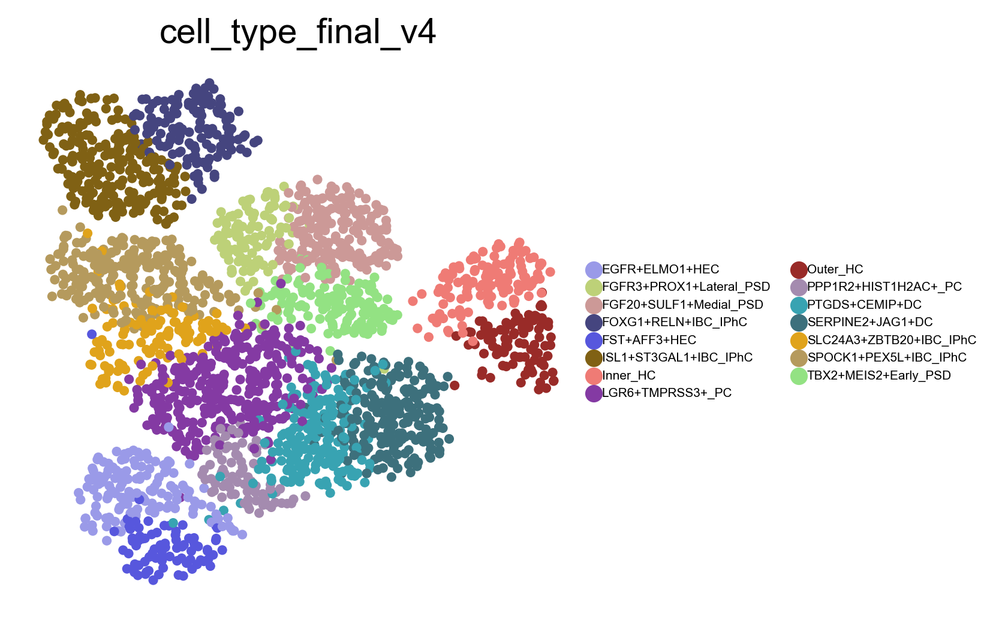

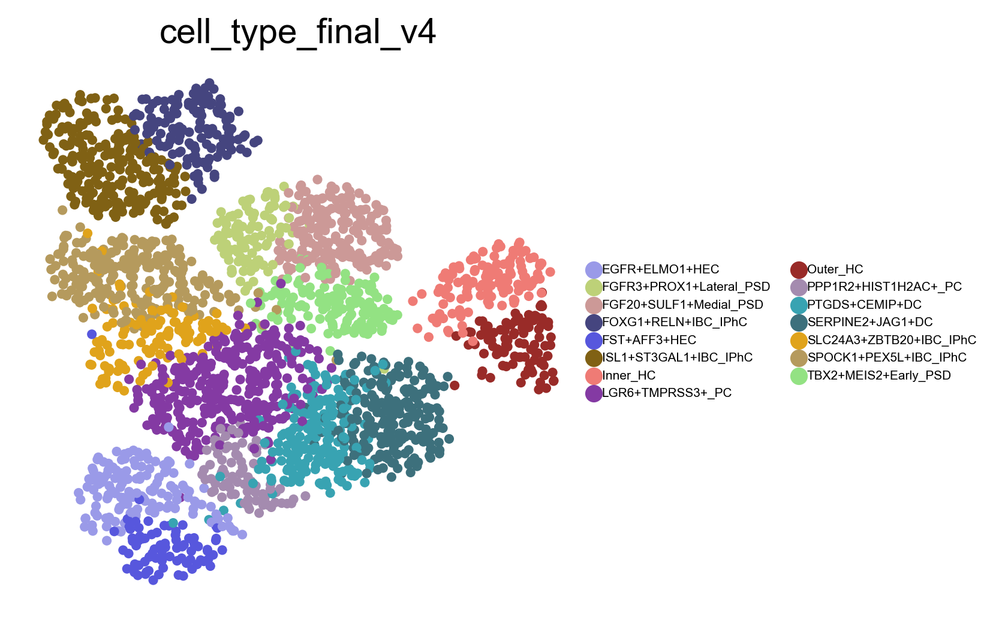

In [12]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.umap(
    adata,legend_fontsize=5,color="cell_type_final_v4",size=60,   )#legend_loc='on data',
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.umap(
    adata_new,legend_fontsize=5,color="cell_type_final_v4",size=60,   )#legend_loc='on data',

In [13]:
#SUBSTRACT HAIR CELLS, AND SUBDIVE INTO ATOH1+/- INNER/OUTER HAIR CELLS, AS IMMATURE/MATURE HAIR CELLS.
adata_new_HC=adata_new[adata_new.obs['cell_type_final_v4'].isin([ 'Inner_HC','Outer_HC', ])]
adata_new_HC.obs['cell_type_final_v4'].value_counts()
#SUBSTRACT lateral/medial PSD cells
adata_new_LPSD=adata_new[adata_new.obs['cell_type_final_v4'].isin([ 'FGFR3+PROX1+Lateral_PSD', ])]
adata_new_LPSD.obs['cell_type_final_v4'].value_counts()
adata_new_MPSD=adata_new[adata_new.obs['cell_type_final_v4'].isin([ 'FGF20+SULF1+Medial_PSD', ])]
adata_new_MPSD.obs['cell_type_final_v4'].value_counts()
adata_new_early_PSD=adata_new[adata_new.obs['cell_type_final_v4'].isin([ 'TBX2+MEIS2+Early_PSD', ])]
adata_new_early_PSD.obs['cell_type_final_v4'].value_counts()

cell_type_final_v4
Inner_HC    116
Outer_HC     94
Name: count, dtype: int64

cell_type_final_v4
FGFR3+PROX1+Lateral_PSD    109
Name: count, dtype: int64

cell_type_final_v4
FGF20+SULF1+Medial_PSD    191
Name: count, dtype: int64

cell_type_final_v4
TBX2+MEIS2+Early_PSD    138
Name: count, dtype: int64

In [14]:
adata_new_HC

View of AnnData object with n_obs × n_vars = 210 × 46922
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'sample_id2', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'leiden_R', 'cell_type_final', 'cell_type_final_v4', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels'
    var: 'gene_ids-0', 'feature_types-0', 'Gene-0', 'mt-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'Gene-1', 'mt-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'highly_v

In [15]:
import scvelo as scv
scv.set_figure_params(figsize=(4,4))
import matplotlib.pyplot as plt

In [16]:
adata_new_HC_v3=sc.read('human_HC_final.h5ad')
adata_new_HC_v3

AnnData object with n_obs × n_vars = 203 × 13994
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'leiden_R', 'low_ncounts', 'high_mito', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'leiden_res1.0', 'is_doublet_scrub', 'leiden_res1.1', 'leiden_res4.0', 'leiden_res2.0', '_scvi_batch', '_scvi_labels', 'leiden_scanvi_2.0', 'leiden_scanvi_3.0', 'leiden_scanvi_4.0', 'cell_type_final', 'cell_type_final_v2', 'scANVI_res2.0', 'cell_type_final_v4'
    var: 'Gene', 'mt', 'gene_ids-0', 'feature_types-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', '

In [17]:
adata=sc.read('human_cochlea_annotation.h5ad')
adata

AnnData object with n_obs × n_vars = 82533 × 13994
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'leiden_R', 'low_ncounts', 'high_mito', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'leiden_res1.0', 'is_doublet_scrub', 'leiden_res1.1', 'leiden_res4.0', 'leiden_res2.0', '_scvi_batch', '_scvi_labels', 'leiden_scanvi_2.0', 'leiden_scanvi_3.0', 'leiden_scanvi_4.0', 'cell_type_final'
    var: 'Gene', 'mt', 'gene_ids-0', 'feature_types-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'n_cells_by_co

In [18]:
adata_new_HC_v3.obs['cell_type_final_v4'].value_counts()

cell_type_final_v4
Inner_HC    109
Outer_HC     94
Name: count, dtype: int64

In [19]:
adata_new

AnnData object with n_obs × n_vars = 2388 × 46922
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'sample_id2', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'leiden_R', 'cell_type_final', 'cell_type_final_v4', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels'
    var: 'gene_ids-0', 'feature_types-0', 'Gene-0', 'mt-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'Gene-1', 'mt-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'highly_variable

In [20]:
adata_new_hc=adata_all[adata_new_HC_v3.obs.index]
adata_new_hc

View of AnnData object with n_obs × n_vars = 203 × 46922
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'sample_id2', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'leiden_R'
    var: 'gene_ids-0', 'feature_types-0', 'Gene-0', 'mt-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'Gene-1', 'mt-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'n_cells-1', 'gene_ids-10', 'feature_types-10', 'Gene-10', 'mt-10', 'n_cells_by_counts-10', 'mean_counts-10', 'pct_dropout_by_counts-10', 'total_counts-10', 'highly_variable-10', 'means-10', 'dis

In [21]:
#adata_new.layers['counts']=adata_integration.layers['counts']
adata=adata_new_HC_v3.copy()
adata_new_hc.obsp['connectivities']=adata.obsp['connectivities']
adata_new_hc.obsp['distances']=adata.obsp['distances']

adata_new_hc.obsm['X_pca']=adata.obsm['X_pca']
adata_new_hc.obsm['X_scANVI']=adata.obsm['X_scANVI']
adata_new_hc.obsm['X_scVI']=adata.obsm['X_scVI']
adata_new_hc.obsm['X_umap']=adata.obsm['X_umap']
adata_new_hc.obsm['_scvi_extra_categorical_covs']=adata.obsm['_scvi_extra_categorical_covs']
adata_new_hc.obsm['_scvi_extra_continuous_covs']=adata.obsm['_scvi_extra_continuous_covs']

adata_new_hc.uns['_scvi_manager_uuid']=adata.uns['_scvi_manager_uuid']
adata_new_hc.uns['_scvi_uuid']=adata.uns['_scvi_uuid']
adata_new_hc.uns['annotation_colors']=adata.uns['annotation_colors']
adata_new_hc.uns['ccgs']=adata.uns['ccgs']
adata_new_hc.uns['cell_type_final_colors']=adata.uns['cell_type_final_colors']
adata_new_hc.uns['cell_type_final_v4_colors']=adata.uns['cell_type_final_v4_colors']
adata_new_hc.uns['hvg']=adata.uns['hvg']
adata_new_hc.uns['rank_genes_groups']=adata.uns['rank_genes_groups']
adata_new_hc.uns['log1p']=adata.uns['log1p']
adata_new_hc.uns['neighbors']=adata.uns['neighbors']
adata_new_hc.uns['sample_colors']=adata.uns['sample_colors']
adata_new_hc.uns['umap']=adata.uns['umap']
adata_new_hc.obs['cell_type_final']=adata.obs['cell_type_final']
adata_new_hc.obs['cell_type_final_v4']=adata.obs['cell_type_final_v4']
adata_new_hc.obs['low_ncounts']=adata.obs['low_ncounts']
adata_new_hc.obs['low_ncounts_high_mito']=adata.obs['low_ncounts_high_mito']
adata_new_hc.obs['S_score']=adata.obs['S_score']
adata_new_hc.obs['G2M_score']=adata.obs['G2M_score']
adata_new_hc.obs['phase']=adata.obs['phase']
adata_new_hc.obs['scrublet_score']=adata.obs['scrublet_score']
adata_new_hc.obs['scrublet_cluster_score']=adata.obs['scrublet_cluster_score']
adata_new_hc.obs['zscore']=adata.obs['zscore']
adata_new_hc.obs['bh_pval']=adata.obs['bh_pval']
adata_new_hc.obs['bonf_pval']=adata.obs['bonf_pval']
adata_new_hc.obs['is_doublet']=adata.obs['is_doublet']
adata_new_hc.obs['is_doublet_scrub']=adata.obs['is_doublet_scrub']
adata_new_hc.obs['_scvi_batch']=adata.obs['_scvi_batch']
adata_new_hc.obs['_scvi_labels']=adata.obs['_scvi_labels']

In [22]:
#subset inner hc upon atoh1+/- condition
adata_ihc = adata_new_hc[adata_new_hc.obs['cell_type_final_v4']=='Inner_HC']
adata_ihc
adata_ihc_atoh1_pos = adata_ihc[adata_ihc[: , 'ATOH1'].X > 0, :] 
adata_ihc_atoh1_pos
adata_ihc_atoh1_pos.obs['cell_type_group']="IHC_ATOH1_positive"
adata_ihc_atoh1_pos.obs['cell_type_subgroup']="IHC_immature"
adata_ihc_atoh1_neg= adata_ihc[adata_ihc[: , 'ATOH1'].X == 0, :]
adata_ihc_atoh1_neg.obs['cell_type_group']="IHC_ATOH1_negative"
adata_ihc_atoh1_neg.obs['cell_type_subgroup']="IHC_mature"
adata_ihc_atoh1_neg

View of AnnData object with n_obs × n_vars = 109 × 46922
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'sample_id2', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'leiden_R', 'cell_type_final', 'cell_type_final_v4', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels'
    var: 'gene_ids-0', 'feature_types-0', 'Gene-0', 'mt-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'Gene-1', 'mt-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'highly_v

View of AnnData object with n_obs × n_vars = 42 × 46922
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'sample_id2', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'leiden_R', 'cell_type_final', 'cell_type_final_v4', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels'
    var: 'gene_ids-0', 'feature_types-0', 'Gene-0', 'mt-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'Gene-1', 'mt-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'highly_va

AnnData object with n_obs × n_vars = 67 × 46922
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'sample_id2', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'leiden_R', 'cell_type_final', 'cell_type_final_v4', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels', 'cell_type_group', 'cell_type_subgroup'
    var: 'gene_ids-0', 'feature_types-0', 'Gene-0', 'mt-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'Gene-1', 'mt-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts

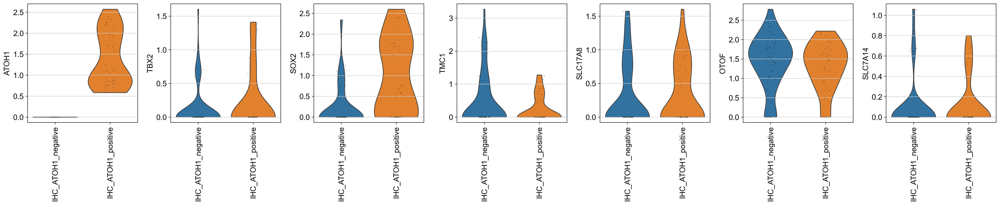

In [23]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
adata=adata_ihc_atoh1_pos.concatenate(adata_ihc_atoh1_neg)
sc.pl.violin(adata, ['ATOH1','TBX2','SOX2','TMC1','SLC17A8','OTOF','SLC7A14',
                                           ],groupby='cell_type_group',rotation=90,)#

In [24]:
#subset outer hc upon atoh1+/- condition
adata_ohc = adata_new_hc[adata_new_hc.obs['cell_type_final_v4']=='Outer_HC']
adata_ohc
adata_ohc_atoh1_pos = adata_ohc[adata_ohc[: , 'ATOH1'].X > 0, :] 
adata_ohc_atoh1_pos
adata_ohc_atoh1_pos.obs['cell_type_group']="OHC_ATOH1_positive"
adata_ohc_atoh1_pos.obs['cell_type_subgroup']="OHC_immature"
adata_ohc_atoh1_neg= adata_ohc[adata_ohc[: , 'ATOH1'].X == 0, :]
adata_ohc_atoh1_neg.obs['cell_type_group']="OHC_ATOH1_negative"
adata_ohc_atoh1_neg.obs['cell_type_subgroup']="OHC_mature"
adata_ohc_atoh1_neg

View of AnnData object with n_obs × n_vars = 94 × 46922
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'sample_id2', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'leiden_R', 'cell_type_final', 'cell_type_final_v4', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels'
    var: 'gene_ids-0', 'feature_types-0', 'Gene-0', 'mt-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'Gene-1', 'mt-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'highly_va

View of AnnData object with n_obs × n_vars = 17 × 46922
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'sample_id2', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'leiden_R', 'cell_type_final', 'cell_type_final_v4', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels'
    var: 'gene_ids-0', 'feature_types-0', 'Gene-0', 'mt-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'Gene-1', 'mt-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'highly_va

AnnData object with n_obs × n_vars = 77 × 46922
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'sample_id2', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'leiden_R', 'cell_type_final', 'cell_type_final_v4', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels', 'cell_type_group', 'cell_type_subgroup'
    var: 'gene_ids-0', 'feature_types-0', 'Gene-0', 'mt-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'Gene-1', 'mt-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts

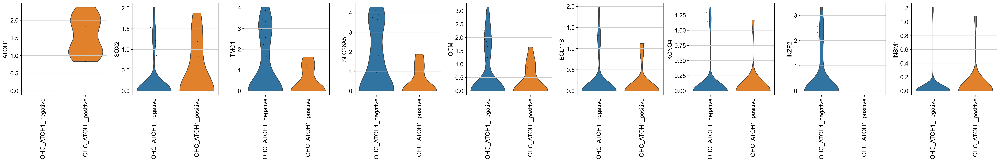

In [25]:
adata=adata_ohc_atoh1_pos.concatenate(adata_ohc_atoh1_neg)
sc.pl.violin(adata, ['ATOH1','SOX2','TMC1','SLC26A5','OCM','BCL11B','KCNQ4','IKZF2','INSM1',
                                           ],groupby='cell_type_group',rotation=90,)#

In [26]:
adata_hc_integrated=adata_ohc_atoh1_pos.concatenate(adata_ohc_atoh1_neg,adata_ihc_atoh1_pos,adata_ihc_atoh1_neg)
adata_hc_integrated

AnnData object with n_obs × n_vars = 203 × 46922
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'sample_id2', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'leiden_R', 'cell_type_final', 'cell_type_final_v4', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels', 'cell_type_group', 'cell_type_subgroup'
    var: 'gene_ids-10', 'feature_types-10', 'Gene-10', 'mt-10', 'n_cells_by_counts-10', 'mean_counts-10', 'pct_dropout_by_counts-10', 'total_counts-10', 'highly_variable-10', 'means-10', 'dispersions-10', 'dispersions_norm-10', 'n_cells-10', 'genome-10', 'gene_ids-11', 'feature_types-11', 'Gene-11', 'mt-11', 'n_cells_by_counts-11', 'mean_c

In [27]:
adata_new_MPSD.obs['cell_type_group']="Medial_PSD"
adata_new_MPSD.obs['cell_type_subgroup']="Medial_PSD"
adata_ihc_mpsd=adata_new_MPSD.concatenate(adata_ihc_atoh1_pos,adata_ihc_atoh1_neg)
adata_ihc_mpsd
adata_new_LPSD.obs['cell_type_group']="Lateral_PSD"
adata_new_LPSD.obs['cell_type_subgroup']="Lateral_PSD"
adata_ohc_lpsd=adata_new_LPSD.concatenate(adata_ohc_atoh1_pos,adata_ohc_atoh1_neg)
adata_ohc_lpsd

AnnData object with n_obs × n_vars = 300 × 46922
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'sample_id2', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'leiden_R', 'cell_type_final', 'cell_type_final_v4', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels', 'cell_type_group', 'cell_type_subgroup'
    var: 'feature_types-10', 'mt-10', 'n_cells_by_counts-10', 'mean_counts-10', 'pct_dropout_by_counts-10', 'total_counts-10', 'highly_variable-10', 'means-10', 'dispersions-10', 'dispersions_norm-10', 'n_cells-10', 'genome-10', 'feature_types-11', 'mt-11', 'n_cells_by_counts-11', 'mean_counts-11', 'pct_dropout_by_counts-11', 'total_counts

AnnData object with n_obs × n_vars = 203 × 46922
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'sample_id2', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'leiden_R', 'cell_type_final', 'cell_type_final_v4', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels', 'cell_type_group', 'cell_type_subgroup'
    var: 'feature_types-10', 'mt-10', 'n_cells_by_counts-10', 'mean_counts-10', 'pct_dropout_by_counts-10', 'total_counts-10', 'highly_variable-10', 'means-10', 'dispersions-10', 'dispersions_norm-10', 'n_cells-10', 'genome-10', 'feature_types-11', 'mt-11', 'n_cells_by_counts-11', 'mean_counts-11', 'pct_dropout_by_counts-11', 'total_counts

In [28]:
adata_new_early_PSD.obs['cell_type_group']="Early_PSD"
adata_new_early_PSD.obs['cell_type_subgroup']="Early_PSD"
adata=adata_new_early_PSD.concatenate(adata_ohc_lpsd, adata_ihc_mpsd)
adata

AnnData object with n_obs × n_vars = 641 × 46922
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'sample_id2', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'leiden_R', 'cell_type_final', 'cell_type_final_v4', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels', 'cell_type_group', 'cell_type_subgroup'
    var: 'feature_types-10', 'mt-10', 'n_cells_by_counts-10', 'mean_counts-10', 'pct_dropout_by_counts-10', 'total_counts-10', 'highly_variable-10', 'means-10', 'dispersions-10', 'dispersions_norm-10', 'n_cells-10', 'genome-10', 'feature_types-11', 'mt-11', 'n_cells_by_counts-11', 'mean_counts-11', 'pct_dropout_by_counts-11', 'total_counts

In [29]:
#set to age bins
cut_labels_4 = [ '< 14','< 26', ]
cut_bins = [0, 14,26 ]

adata.obs["age_bins"] = pd.cut(adata.obs["gw"], bins=cut_bins, labels=cut_labels_4).astype("str")
adata.obs["age_bins"] = pd.Categorical(adata.obs["age_bins"], categories=cut_labels_4, ordered=True)
adata.obs["age_bins"]

9.5gw_AAAGAACCAAACACGG-0       < 14
9.5gw_AAAGAACGTAACGTTC-0       < 14
9.5gw_AAAGTCCAGAGGCTGT-0       < 14
9.5gw_AAAGTCCCATGAAAGT-0       < 14
9.5gw_AAAGTCCGTTCTGAGT-0       < 14
                               ... 
23+2gw_CATGCGCAGAATGACG-2-2    < 26
23+2gw_GAAGTGATCAATGTCA-2-2    < 26
23+2gw_GGAACTAAGTGCTGTG-2-2    < 26
23+2gw_GGTTATATCTATCGCC-2-2    < 26
23+2gw_TAGTACGGTGTTTGCT-2-2    < 26
Name: age_bins, Length: 641, dtype: category
Categories (2, object): ['< 14' < '< 26']

In [30]:
#set to age bins
cut_labels_4 = [ '< 14','< 26', ]
cut_bins = [0, 14,26 ]

adata_new_hc.obs["age_bins"] = pd.cut(adata_new_hc.obs["gw"], bins=cut_bins, labels=cut_labels_4).astype("str")
adata_new_hc.obs["age_bins"] = pd.Categorical(adata_new_hc.obs["age_bins"], categories=cut_labels_4, ordered=True)
adata_new_hc.obs["age_bins"]

14+3gw_AACAAAGCATTCTCCG    < 14
14+3gw_AACAACCAGTGCGCTC    < 14
14+3gw_AAGCGTTAGGCACTCC    < 14
14+3gw_ACAGAAAAGGTGCCAA    < 14
14+3gw_ACCATTTAGGCCGCTT    < 14
                           ... 
23+2gw_TAGTGAGAGTGAGGGT    < 26
23+2gw_TCAAGAACACAACAGG    < 26
23+2gw_TGATCAATCCGGTTGA    < 26
23+2gw_TGCTAGCCAATTAGCT    < 26
23+2gw_TGGACTAGTGCTCCAC    < 26
Name: age_bins, Length: 203, dtype: category
Categories (2, object): ['< 14' < '< 26']

In [31]:
# Convert covariate to continous
adata.obs['age_bins'] = adata.obs['age_bins'].cat.codes
adata.obs['age_bins']
adata.obs.groupby(['gw','sample_id','age_bins']).apply(len)

9.5gw_AAAGAACCAAACACGG-0       0
9.5gw_AAAGAACGTAACGTTC-0       0
9.5gw_AAAGTCCAGAGGCTGT-0       0
9.5gw_AAAGTCCCATGAAAGT-0       0
9.5gw_AAAGTCCGTTCTGAGT-0       0
                              ..
23+2gw_CATGCGCAGAATGACG-2-2    1
23+2gw_GAAGTGATCAATGTCA-2-2    1
23+2gw_GGAACTAAGTGCTGTG-2-2    1
23+2gw_GGTTATATCTATCGCC-2-2    1
23+2gw_TAGTACGGTGTTTGCT-2-2    1
Name: age_bins, Length: 641, dtype: int8

gw  sample_id  age_bins
9   gw9        0           125
11  gw11       0           141
14  gw14       0           249
15  gw15       1            18
16  gw16       1            43
17  gw17_1     1             2
    gw17_3     1            30
18  gw18       1             2
22  gw22_1     1             1
23  gw23       1            30
dtype: int64

In [32]:
# Convert covariate to continous
adata_new_hc.obs['age_bins'] = adata_new_hc.obs['age_bins'].cat.codes
adata_new_hc.obs['age_bins']
adata_new_hc.obs.groupby(['gw','sample_id','age_bins']).apply(len)

14+3gw_AACAAAGCATTCTCCG    0
14+3gw_AACAACCAGTGCGCTC    0
14+3gw_AAGCGTTAGGCACTCC    0
14+3gw_ACAGAAAAGGTGCCAA    0
14+3gw_ACCATTTAGGCCGCTT    0
                          ..
23+2gw_TAGTGAGAGTGAGGGT    1
23+2gw_TCAAGAACACAACAGG    1
23+2gw_TGATCAATCCGGTTGA    1
23+2gw_TGCTAGCCAATTAGCT    1
23+2gw_TGGACTAGTGCTCCAC    1
Name: age_bins, Length: 203, dtype: int8

gw  sample_id  age_bins
14  gw14       0           89
15  gw15       1           17
16  gw16       1           33
17  gw17_1     1            1
    gw17_3     1           30
18  gw18       1            2
22  gw22_1     1            1
23  gw23       1           30
dtype: int64

In [33]:
cut_labels_5 = ['< 12', '< 16','< 20','< 24','< 28', ]
cut_bins = [0, 12, 16,20,24,28 ]

adata.obs["age_bins2"] = pd.cut(adata.obs["gw"], bins=cut_bins, labels=cut_labels_5).astype("str")
adata.obs["age_bins2"] = pd.Categorical(adata.obs["age_bins2"], categories=cut_labels_5, ordered=True)
adata.obs["age_bins2"]

9.5gw_AAAGAACCAAACACGG-0       < 12
9.5gw_AAAGAACGTAACGTTC-0       < 12
9.5gw_AAAGTCCAGAGGCTGT-0       < 12
9.5gw_AAAGTCCCATGAAAGT-0       < 12
9.5gw_AAAGTCCGTTCTGAGT-0       < 12
                               ... 
23+2gw_CATGCGCAGAATGACG-2-2    < 24
23+2gw_GAAGTGATCAATGTCA-2-2    < 24
23+2gw_GGAACTAAGTGCTGTG-2-2    < 24
23+2gw_GGTTATATCTATCGCC-2-2    < 24
23+2gw_TAGTACGGTGTTTGCT-2-2    < 24
Name: age_bins2, Length: 641, dtype: category
Categories (5, object): ['< 12' < '< 16' < '< 20' < '< 24' < '< 28']

In [34]:
cut_labels_5 = ['< 12', '< 16','< 20','< 24','< 28', ]
cut_bins = [0, 12, 16,20,24,28 ]

adata_new_hc.obs["age_bins2"] = pd.cut(adata_new_hc.obs["gw"], bins=cut_bins, labels=cut_labels_5).astype("str")
adata_new_hc.obs["age_bins2"] = pd.Categorical(adata_new_hc.obs["age_bins2"], categories=cut_labels_5, ordered=True)
adata_new_hc.obs["age_bins2"]

14+3gw_AACAAAGCATTCTCCG    < 16
14+3gw_AACAACCAGTGCGCTC    < 16
14+3gw_AAGCGTTAGGCACTCC    < 16
14+3gw_ACAGAAAAGGTGCCAA    < 16
14+3gw_ACCATTTAGGCCGCTT    < 16
                           ... 
23+2gw_TAGTGAGAGTGAGGGT    < 24
23+2gw_TCAAGAACACAACAGG    < 24
23+2gw_TGATCAATCCGGTTGA    < 24
23+2gw_TGCTAGCCAATTAGCT    < 24
23+2gw_TGGACTAGTGCTCCAC    < 24
Name: age_bins2, Length: 203, dtype: category
Categories (5, object): ['< 12' < '< 16' < '< 20' < '< 24' < '< 28']

In [35]:
# Convert covariate to continous
adata.obs['age_bins2'] = adata.obs['age_bins2'].cat.codes
adata.obs['age_bins2']
adata.obs.groupby(['gw','sample_id','age_bins2']).apply(len)

9.5gw_AAAGAACCAAACACGG-0       0
9.5gw_AAAGAACGTAACGTTC-0       0
9.5gw_AAAGTCCAGAGGCTGT-0       0
9.5gw_AAAGTCCCATGAAAGT-0       0
9.5gw_AAAGTCCGTTCTGAGT-0       0
                              ..
23+2gw_CATGCGCAGAATGACG-2-2    3
23+2gw_GAAGTGATCAATGTCA-2-2    3
23+2gw_GGAACTAAGTGCTGTG-2-2    3
23+2gw_GGTTATATCTATCGCC-2-2    3
23+2gw_TAGTACGGTGTTTGCT-2-2    3
Name: age_bins2, Length: 641, dtype: int8

gw  sample_id  age_bins2
9   gw9        0            125
11  gw11       0            141
14  gw14       1            249
15  gw15       1             18
16  gw16       1             43
17  gw17_1     2              2
    gw17_3     2             30
18  gw18       2              2
22  gw22_1     3              1
23  gw23       3             30
dtype: int64

In [36]:
# Convert covariate to continous
adata_new_hc.obs['age_bins2'] = adata_new_hc.obs['age_bins2'].cat.codes
adata_new_hc.obs['age_bins2']
adata_new_hc.obs.groupby(['gw','sample_id','age_bins2']).apply(len)

14+3gw_AACAAAGCATTCTCCG    1
14+3gw_AACAACCAGTGCGCTC    1
14+3gw_AAGCGTTAGGCACTCC    1
14+3gw_ACAGAAAAGGTGCCAA    1
14+3gw_ACCATTTAGGCCGCTT    1
                          ..
23+2gw_TAGTGAGAGTGAGGGT    3
23+2gw_TCAAGAACACAACAGG    3
23+2gw_TGATCAATCCGGTTGA    3
23+2gw_TGCTAGCCAATTAGCT    3
23+2gw_TGGACTAGTGCTCCAC    3
Name: age_bins2, Length: 203, dtype: int8

gw  sample_id  age_bins2
14  gw14       1            89
15  gw15       1            17
16  gw16       1            33
17  gw17_1     2             1
    gw17_3     2            30
18  gw18       2             2
22  gw22_1     3             1
23  gw23       3            30
dtype: int64

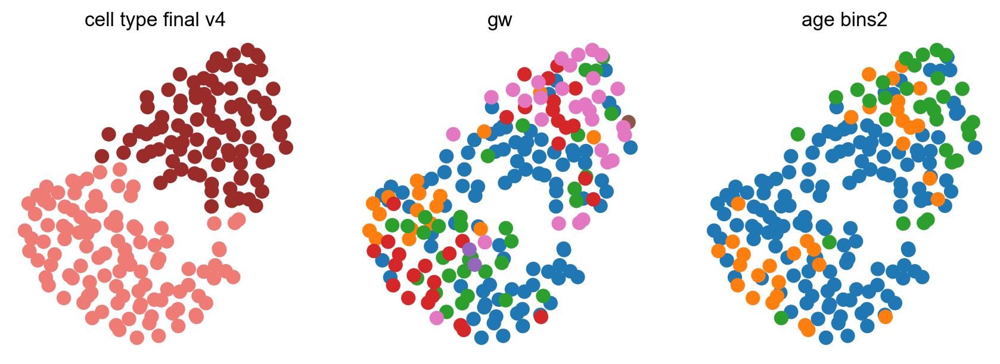

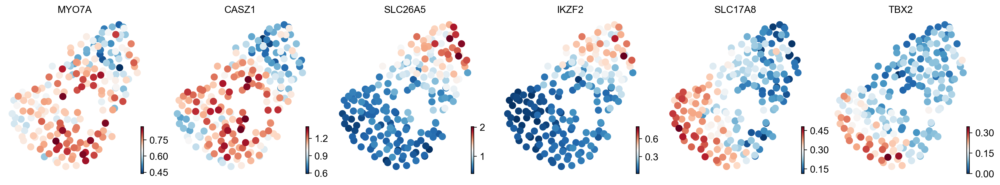

In [37]:
scv.set_figure_params(figsize=(3.5,3.5))
scv.pl.umap(adata_new_hc,color=["cell_type_final_v4","gw","age_bins2"])
scv.pl.umap(adata_new_hc, color=['MYO7A','CASZ1','SLC26A5',"IKZF2","SLC17A8","TBX2",],smooth=True)
#plt.savefig("figures/HC_analysis/HC_HUMAN_MARKERS.pdf",dpi=600)

In [38]:
HC=['IKZF2','INSM1','TBX2','CASZ1',]

Text(0.5, 1.0, 'IKZF2')

Text(0.5, 1.0, 'INSM1')

Text(0.5, 1.0, 'TBX2')

Text(0.5, 1.0, 'CASZ1')

meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped


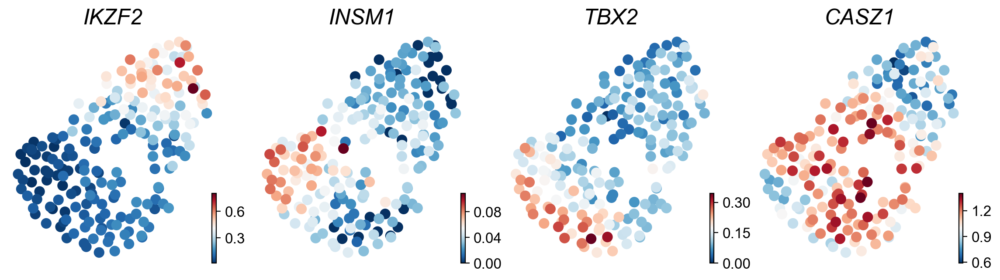

In [39]:
axs=scv.pl.umap(adata_new_hc,color=HC,smooth=True,show=False,)
for ax in axs:
    ax.set_title(ax.get_title(),style="italic",fontsize=18)
plt.savefig("figures/HC_analysis/HC_HUMAN_TFS.pdf",dpi=600)

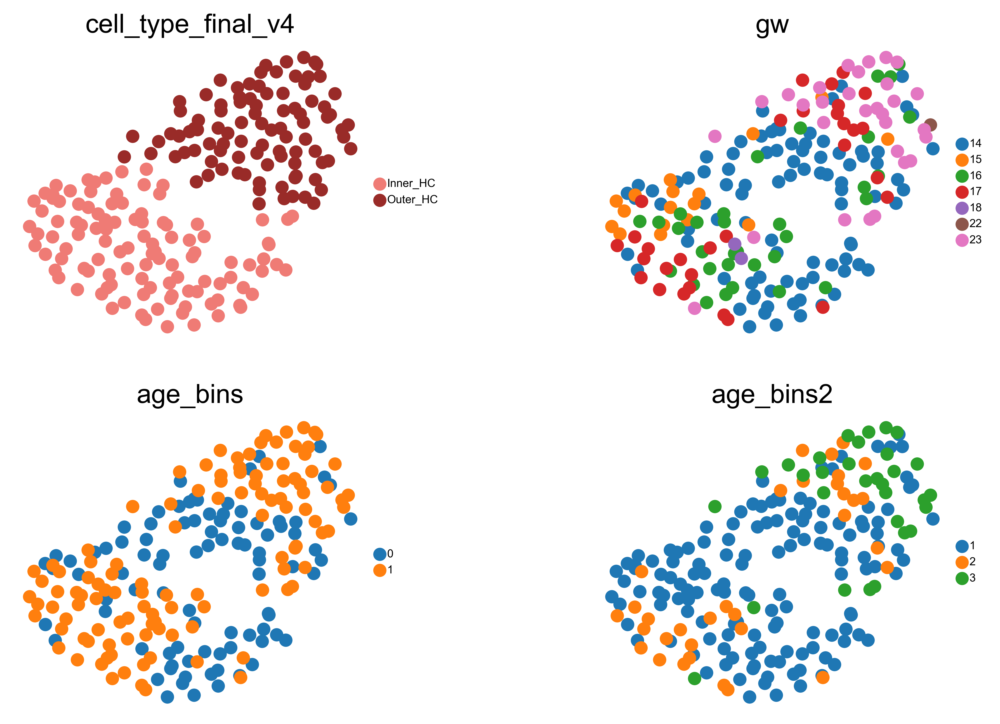

In [40]:
sc.set_figure_params(figsize=(3,3),frameon=False,dpi=300,dpi_save=600)
sc.pl.umap(adata_new_hc, color=['cell_type_final_v4','gw', 'age_bins','age_bins2',],
           size=200,legend_fontsize=6,ncols = 2,wspace = 0.5,)

meta NOT subset; don't know how to subset; dropped


saving figure to file ./figures/scvelo_cochlea-HC_HUMAN_age.pdf


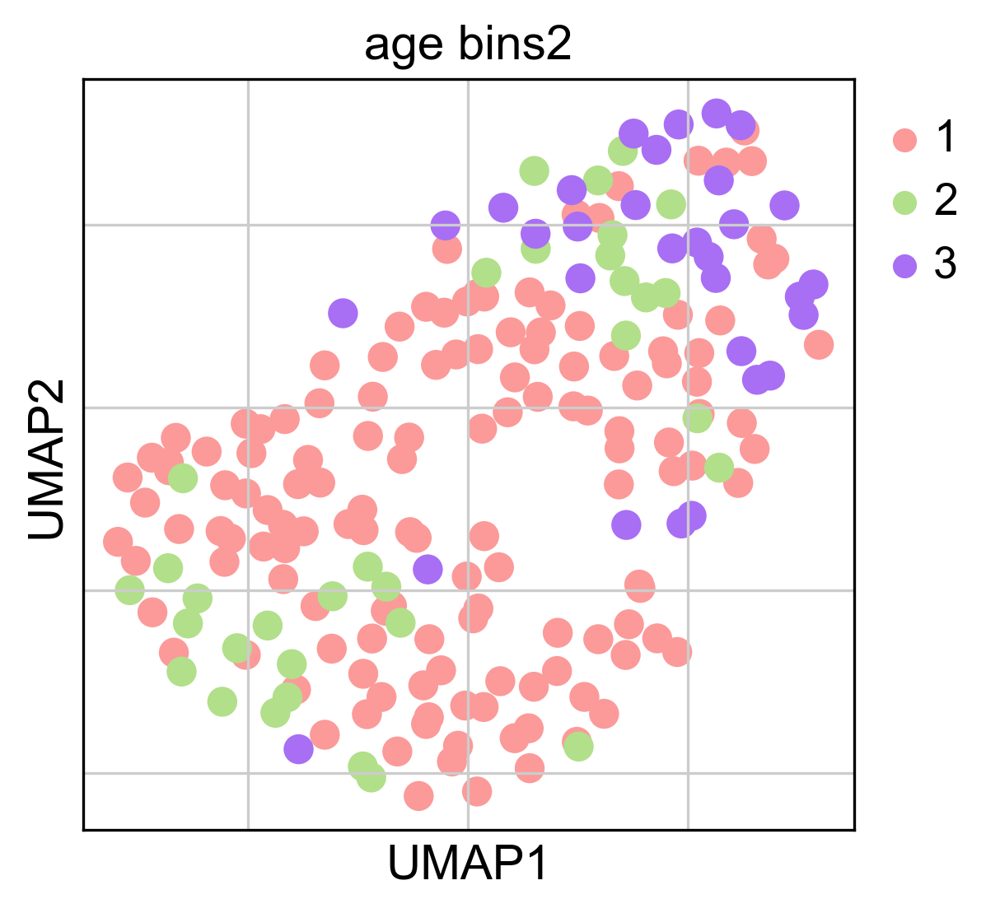

In [41]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
scv.pl.umap(adata_new_hc,color="age_bins2",palette=["#FB9A99","#B2DF8A","#a86ef4"]
           ,frameon=True, save="cochlea-HC_HUMAN_age.pdf")

In [42]:
HC=['ID4','INSM1','NFE2L2','NR2F2',]

Text(0.5, 1.0, 'ID4')

Text(0.5, 1.0, 'INSM1')

Text(0.5, 1.0, 'NFE2L2')

Text(0.5, 1.0, 'NR2F2')

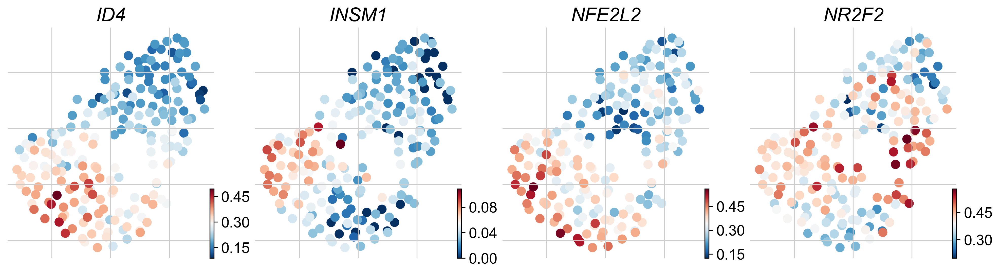

In [43]:
axs=scv.pl.umap(adata_new_hc,color=HC,smooth=True,show=False,)
for ax in axs:
    ax.set_title(ax.get_title(),style="italic",fontsize=18)
#plt.savefig("figures/HC_analysis/HC_HUMAN_TFS.pdf",dpi=600)

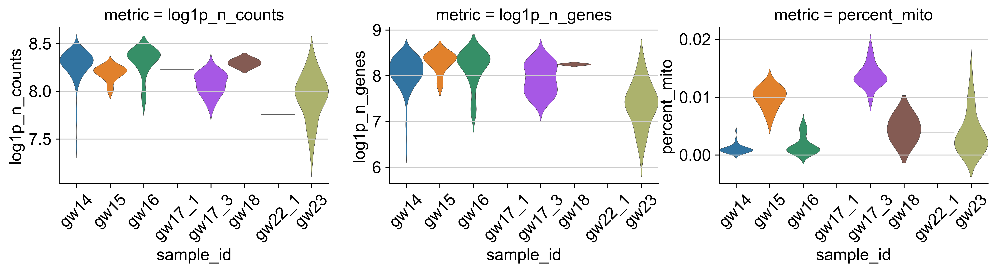

In [44]:
sc.set_figure_params(figsize=(3,3),frameon=False,dpi=300,dpi_save=600)
sk.plot_qc_violin(adata_new_hc, groupby="sample_id",rotation=45)

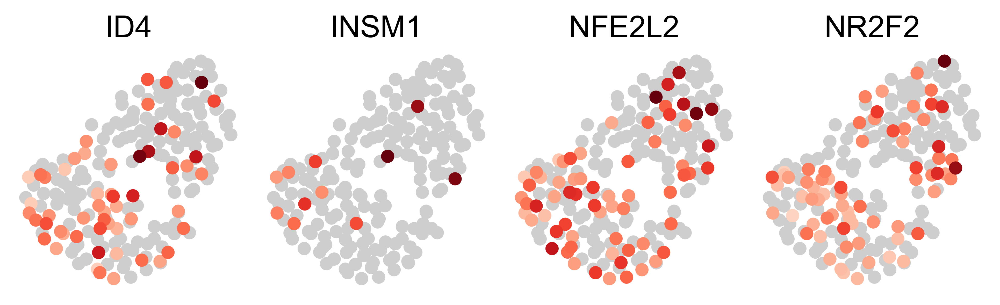

In [45]:
sk.plot_genes(
    adata_new_hc,
    basis="umap",
    ncols=4,
    genes=HC,
    size=150,
)

In [55]:
# 
adata_new_hc.write_loom(data_dir + 'human_HC_annotation.loom')
adata_new_hc.obs.to_csv(data_dir +'human_HC_annotation_obs.csv')
adata_new_hc.var.to_csv(data_dir +'human_HC_annotation_var.csv')

The loom file will lack these fields:
{'X_scVI', '_scvi_extra_continuous_covs', 'X_pca', 'X_scANVI', 'X_umap', '_scvi_extra_categorical_covs'}
Use write_obsm_varm=True to export multi-dimensional annotations


In [56]:
umap=pd.DataFrame(adata_new_hc.obsm['X_umap']).to_csv(data_dir + 'human_HC_annotation_umap.csv')
umap
scANVI=pd.DataFrame(adata_new_hc.obsm['X_scANVI']).to_csv(data_dir + 'human_HC_annotation_scANVI.csv')
scANVI

In [46]:
#reload huamn hc dataset that have been filtered by orthology gene alignment.

In [4]:
#first we profile human and mouse hair cells with the same, shared genes for downstream analysis
adata_mouse = sc.read("mouse_developmental_hc_python_human_id.h5ad")
print("adata_mouse dims: {}".format(adata_mouse.shape)) 

adata_mouse dims: (2915, 16823)


In [5]:
adata_mouse.X

<2915x16823 sparse matrix of type '<class 'numpy.float64'>'
	with 6250435 stored elements in Compressed Sparse Column format>

In [6]:
adata_mouse.layers["counts"] = adata_mouse.X.copy() 
adata_mouse.layers['counts']

<2915x16823 sparse matrix of type '<class 'numpy.float64'>'
	with 6250435 stored elements in Compressed Sparse Column format>

In [7]:
adata_mouse

AnnData object with n_obs × n_vars = 2915 × 16823
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.hb', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.1', 'SCT_snn_res.0.2', 'SCT_snn_res.0.3', 'SCT_snn_res.0.4', 'SCT_snn_res.0.5', 'SCT_snn_res.0.6', 'SCT_snn_res.0.7', 'SCT_snn_res.0.8', 'SCT_snn_res.0.9', 'SCT_snn_res.1', 'SCT_snn_res.1.1', 'SCT_snn_res.1.2', 'SCT_snn_res.1.3', 'SCT_snn_res.1.4', 'SCT_snn_res.1.5', 'SCT_snn_res.1.6', 'seurat_clusters', 'timepoint', 'subtype', 'RNA_snn_res.0.5', 'hctype', 'hc_type', 'RNA_snn_res.0.8'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'
    obsm: 'X_pca', 'X_umap'
    layers: 'counts'

In [8]:
adata_mouse_V2=adata_mouse.copy()

In [9]:
sc.pp.normalize_total(adata_mouse_V2, target_sum=1e4)
sc.pp.log1p(adata_mouse_V2)

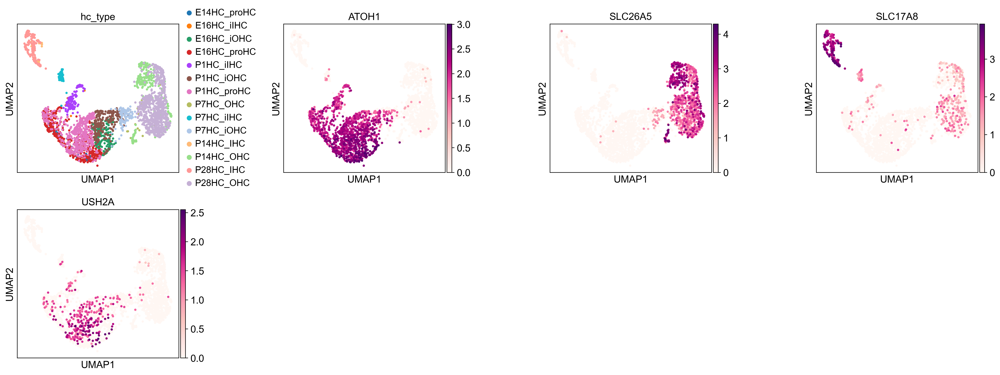

In [10]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.umap(
    adata_mouse_V2,
    color=['hc_type','ATOH1','SLC26A5','SLC17A8','USH2A'],wspace=0.5,
    frameon=True,
    save="_mouse_developmental_hc_USH2A.pdf",
)#ncols = 1,

meta NOT subset; don't know how to subset; dropped


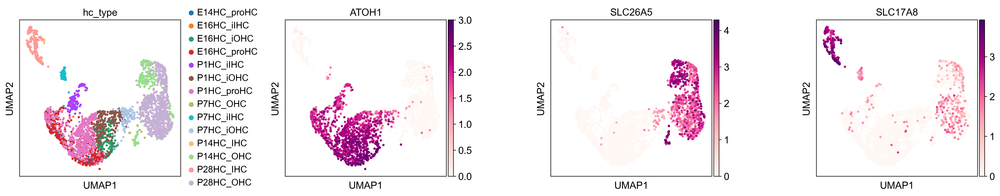

meta NOT subset; don't know how to subset; dropped


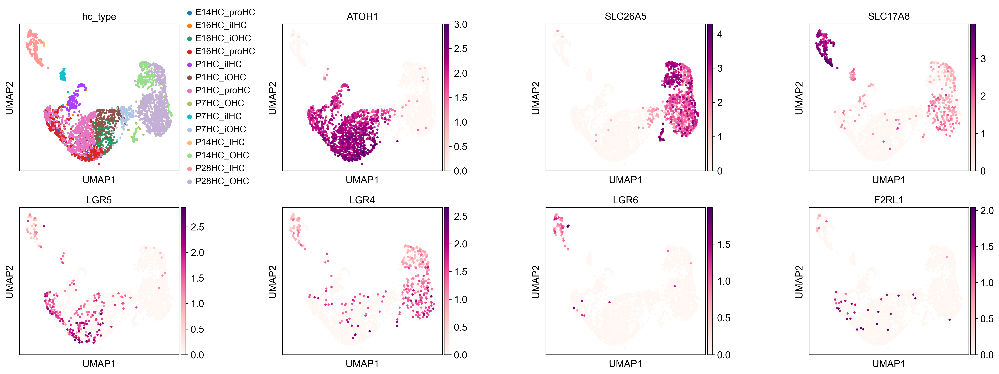

In [16]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.umap(
    adata_mouse_V2,
    color=['hc_type','ATOH1','SLC26A5','SLC17A8',
          'LGR5','LGR4','LGR6','F2RL1'],wspace=0.5,
    frameon=True,ncols=4,
    save="_mouse_developmental_hc_v2.pdf",
)#ncols = 1,

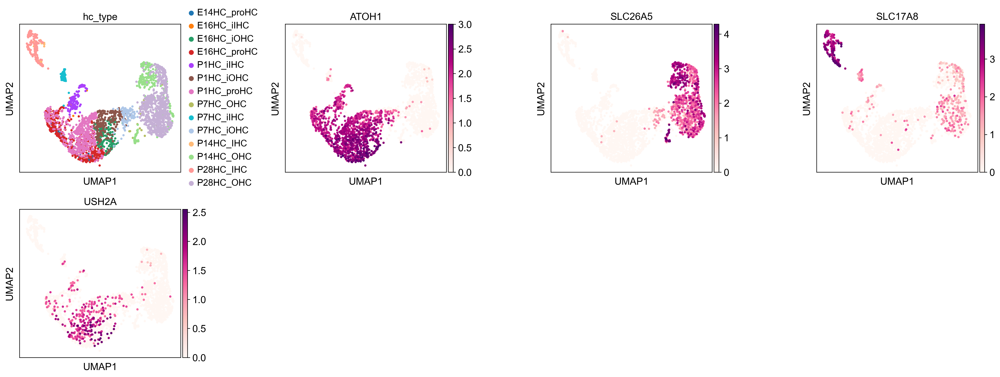

In [13]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.umap(
    adata_mouse_V2,
    color=['hc_type','ATOH1','SLC26A5','SLC17A8','USH2A'],wspace=0.5,
    frameon=True,
    
)#ncols = 1,

In [5]:
#first we profile human and mouse hair cells with the same, shared genes for downstream analysis
adata_human = sc.read("human_developmental_hc_python_human_id.h5ad")
print("adata_human dims: {}".format(adata_human.shape))

adata_human dims: (203, 16569)


In [6]:
adata_human.layers["counts"] = adata_human.X.copy() 
adata_human.layers['counts']

<203x16569 sparse matrix of type '<class 'numpy.float64'>'
	with 525499 stored elements in Compressed Sparse Column format>

In [7]:
adata_human

AnnData object with n_obs × n_vars = 203 × 16569
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'sample_id2', 'donor', 'gw', 'gender', 'sequencing', 'dataset', 'percent_mito', 'n_counts', 'leiden_R', 'cell_type_final', 'cell_type_final_v4', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet_scrub', 'X_scvi_batch', 'X_scvi_labels', 'age_bins', 'age_bins2', 'cellid', 'RNA_snn_res.0.8', 'seurat_clusters'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'
    obsm: 'X_pca', 'X_umap'
    layers: 'counts'

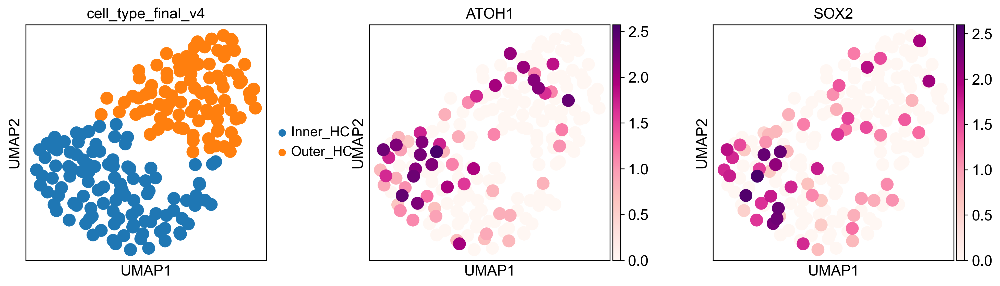

In [8]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.umap(
    adata_human,
    color=['cell_type_final_v4','ATOH1','SOX2'],wspace=0.3,
    frameon=True,
)#ncols = 1,

In [16]:
adata_human.obs["cell_type_final_v4_age"] = (
    adata_human.obs["cell_type_final_v4"].astype(str) + "_" + adata_human.obs["age_bins2"].astype(str)
)

In [17]:
genes=['TBX2','CASZ1','IKZF2','INSM1']

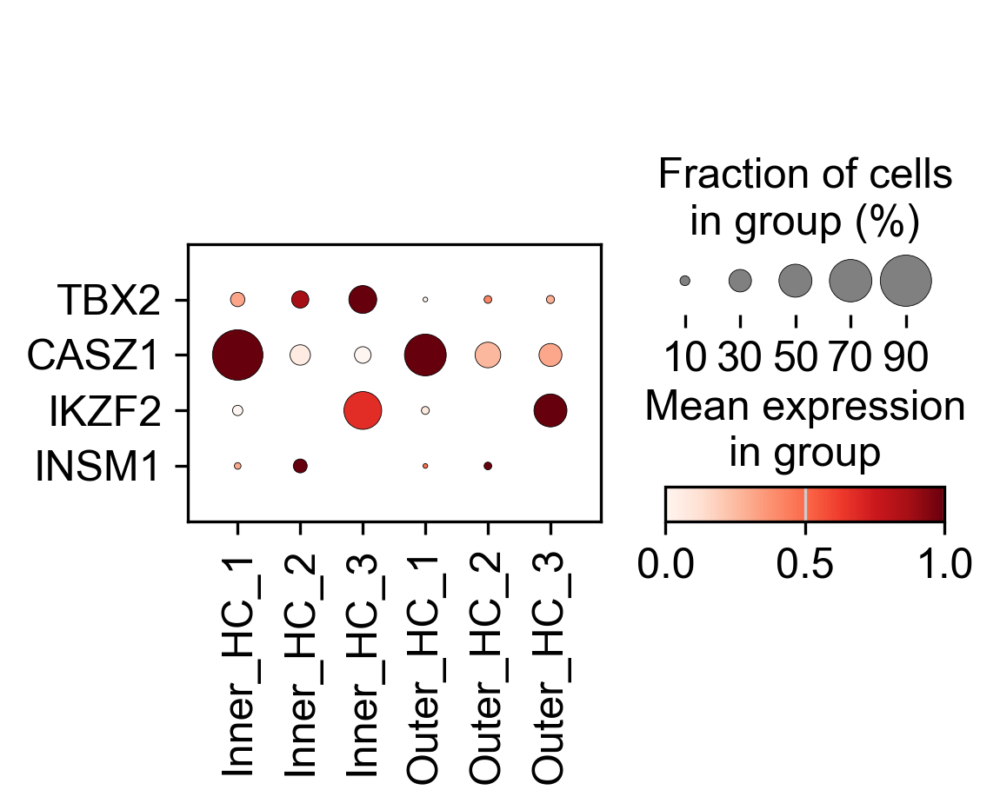

In [25]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.dotplot(adata_human, var_names=genes, groupby='cell_type_final_v4_age', swap_axes=True,
             save="_human_developmental_inner_hc3.pdf",standard_scale='var'
             )#standard_scale='var'

In [9]:
adata_human_IHC=adata_human[adata_human.obs['cell_type_final_v4'].isin([ 'Inner_HC', ])]
adata_human_IHC.obs['cell_type_final_v4'].value_counts()

cell_type_final_v4
Inner_HC    109
Name: count, dtype: int64

In [10]:
adata_human_OHC=adata_human[adata_human.obs['cell_type_final_v4'].isin([ 'Outer_HC', ])]
adata_human_OHC.obs['cell_type_final_v4'].value_counts()

cell_type_final_v4
Outer_HC    94
Name: count, dtype: int64

In [11]:
#sc.pp.regress_out(adata_human_IHC, ['total_counts'])
#sc.pp.scale(adata_human_IHC, max_value=10)
sc.pp.normalize_total(adata_human_IHC, target_sum=1e4)
sc.pp.log1p(adata_human_IHC)
sc.pp.normalize_total(adata_human_OHC, target_sum=1e4)
sc.pp.log1p(adata_human_OHC)

<Axes: ylabel='ATOH1'>

Text(0.5, 1.0, 'ATOH1')

<Axes: ylabel='SOX2'>

Text(0.5, 1.0, 'SOX2')

<Axes: ylabel='TMC1'>

Text(0.5, 1.0, 'TMC1')

<Axes: ylabel='TMC2'>

Text(0.5, 1.0, 'TMC2')

<Axes: ylabel='OTOF'>

Text(0.5, 1.0, 'OTOF')

<Axes: ylabel='SLC17A8'>

Text(0.5, 1.0, 'SLC17A8')

<Axes: ylabel='SLC7A14'>

Text(0.5, 1.0, 'SLC7A14')

<Axes: ylabel='FGF8'>

Text(0.5, 1.0, 'FGF8')

<Axes: ylabel='TBX2'>

Text(0.5, 1.0, 'TBX2')

<Axes: ylabel='CASZ1'>

Text(0.5, 1.0, 'CASZ1')

<Axes: ylabel='INSM1'>

Text(0.5, 1.0, 'INSM1')

(0.0, 1.0, 0.0, 1.0)

(0.0, 1.0, 0.0, 1.0)

(0.0, 1.0, 0.0, 1.0)

(0.0, 1.0, 0.0, 1.0)

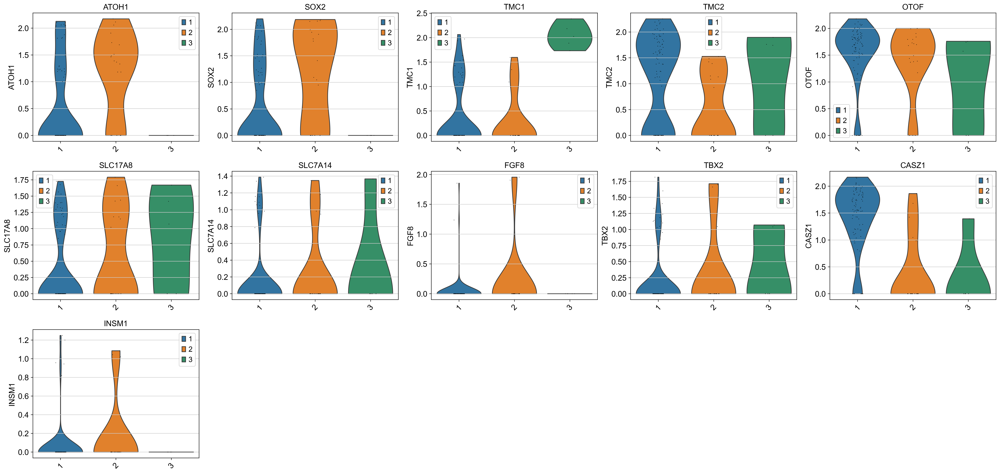

In [12]:
# Convert to categorical and specify the order if necessary
age_bins_order = sorted(adata_human_IHC.obs['age_bins2'].unique())
adata_human_IHC.obs['age_bins2'] = pd.Categorical(adata_human_IHC.obs['age_bins2'], categories=age_bins_order, ordered=True)

# Ensure 'age_bins2' is categorical
adata_human_IHC.obs['age_bins2'] = adata_human_IHC.obs['age_bins2'].astype('category')

# List of genes to plot
genes = ['ATOH1', 'SOX2', 
         'TMC1','TMC2',
          'OTOF','SLC17A8','SLC7A14','FGF8',
         'TBX2', 'CASZ1','INSM1']

# Create a figure with multiple subplots
n_genes = len(genes)
n_cols = 5  # Number of columns (subplots per row)
n_rows = (n_genes + n_cols - 1) // n_cols  # Calculate number of rows

fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows), squeeze=False)
axes = axes.flatten()  # Flatten the axes array for easy iteration

# Plot each gene in a separate subplot
for i, gene in enumerate(genes):
    ax = axes[i]
    sc.pl.violin(adata_human_IHC, gene, groupby='age_bins2', rotation=45, ax=ax, show=False)
    ax.set_title(gene)  # Set the title of each subplot to the gene name

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

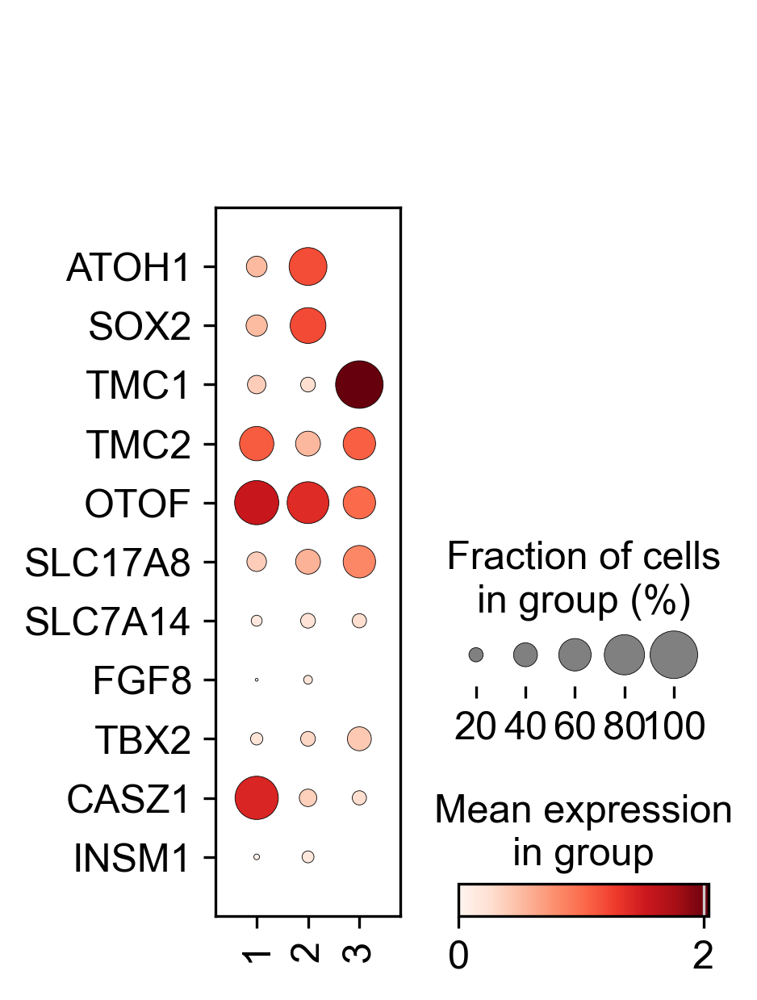

In [13]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.dotplot(adata_human_IHC, var_names=genes, groupby='age_bins2', swap_axes=True,
             save="_human_developmental_inner_hc2.pdf",#standard_scale='var'
             )#standard_scale='var'


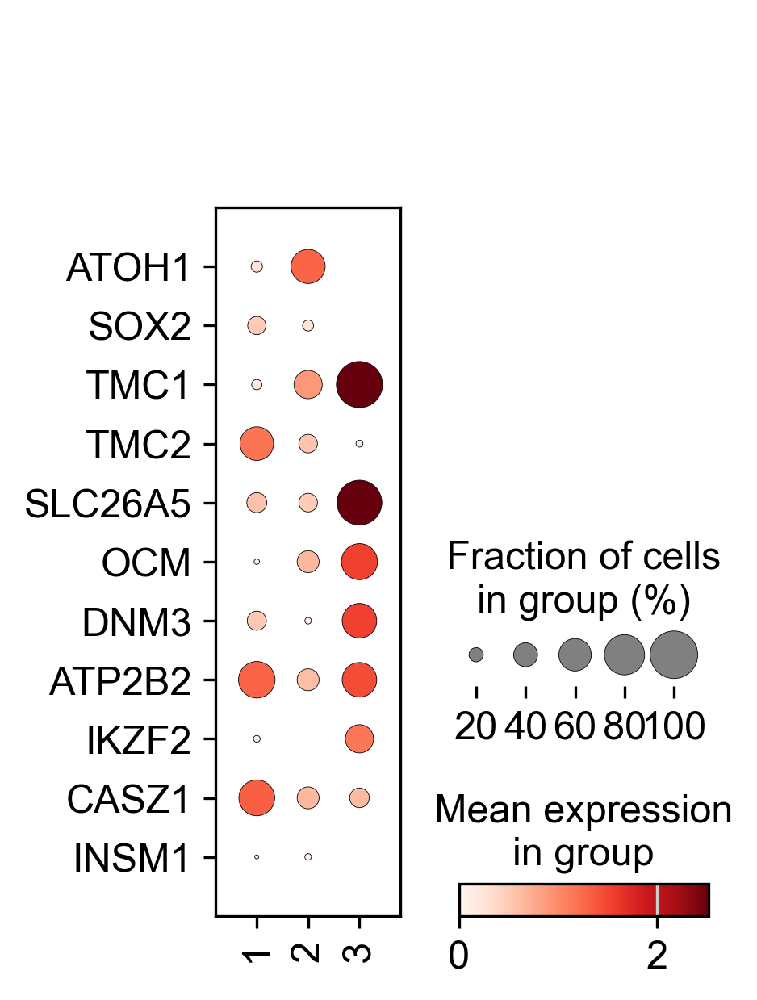

In [14]:
# Convert to categorical and specify the order if necessary
age_bins_order = sorted(adata_human_OHC.obs['age_bins2'].unique())
adata_human_OHC.obs['age_bins2'] = pd.Categorical(adata_human_OHC.obs['age_bins2'], categories=age_bins_order, ordered=True)

# Ensure 'age_bins2' is categorical
adata_human_OHC.obs['age_bins2'] = adata_human_OHC.obs['age_bins2'].astype('category')
genes2 = ['ATOH1', 'SOX2', 
         'TMC1','TMC2',
          'SLC26A5','OCM','DNM3','ATP2B2',
         'IKZF2', 'CASZ1','INSM1']
sc.pl.dotplot(adata_human_OHC, var_names=genes2, groupby='age_bins2',swap_axes=True, 
             save="_human_developmental_outer_hc2.pdf",)#standard_scale='var'

In [183]:
adata_mouse

AnnData object with n_obs × n_vars = 2915 × 16823
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.hb', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.1', 'SCT_snn_res.0.2', 'SCT_snn_res.0.3', 'SCT_snn_res.0.4', 'SCT_snn_res.0.5', 'SCT_snn_res.0.6', 'SCT_snn_res.0.7', 'SCT_snn_res.0.8', 'SCT_snn_res.0.9', 'SCT_snn_res.1', 'SCT_snn_res.1.1', 'SCT_snn_res.1.2', 'SCT_snn_res.1.3', 'SCT_snn_res.1.4', 'SCT_snn_res.1.5', 'SCT_snn_res.1.6', 'seurat_clusters', 'timepoint', 'subtype', 'RNA_snn_res.0.5', 'hctype', 'hc_type', 'RNA_snn_res.0.8'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'
    uns: 'hctype_colors'
    obsm: 'X_pca', 'X_umap'
    layers: 'counts'

In [215]:
adata_mouse.obs['timepoint'].value_counts()
adata_mouse.obs['hc_type'].value_counts()

timepoint
P28HC    943
P1HC     847
E16HC    583
P14HC    294
P7HC     190
E14HC     58
Name: count, dtype: int64

hc_type
P28HC_OHC      780
P1HC_proHC     496
E16HC_proHC    403
P14HC_OHC      261
P1HC_iOHC      222
E16HC_iOHC     170
P28HC_IHC      163
P1HC_iIHC      129
P7HC_iOHC      111
P7HC_iIHC       61
E14HC_proHC     58
P14HC_IHC       33
P7HC_OHC        18
E16HC_iIHC      10
Name: count, dtype: int64

In [185]:
adata_mouse_IHC=adata_mouse[adata_mouse.obs['subtype'].isin([ 'E16iHC','E14iHC','P1IHC','P7IHC','P14IHC','P28IHC' ])]
adata_mouse_IHC.obs['subtype'].value_counts()
adata_mouse_IHC.obs['timepoint'].value_counts()

subtype
E16iHC    583
P1IHC     181
P28IHC    160
P7IHC      61
E14iHC     58
P14IHC     33
Name: count, dtype: int64

timepoint
E16HC    583
P1HC     181
P28HC    160
P7HC      61
E14HC     58
P14HC     33
Name: count, dtype: int64

In [221]:
adata_mouse_IHC_E14=adata_mouse_IHC[adata_mouse_IHC.obs['hc_type'].isin([ 'E14HC_proHC', ])]
adata_mouse_IHC_E14.obs['hc_type'].value_counts()
adata_mouse_IHC_E14.obs['timepoint'].value_counts()
adata_mouse_IHC_E14.obs['devtime']='1'
adata_mouse_IHC_E16=adata_mouse_IHC[adata_mouse_IHC.obs['hc_type'].isin([ 'E16HC_iIHC', ])]
adata_mouse_IHC_E16.obs['hc_type'].value_counts()
adata_mouse_IHC_E16.obs['timepoint'].value_counts()
adata_mouse_IHC_E16.obs['devtime']='1'

hc_type
E14HC_proHC    58
Name: count, dtype: int64

timepoint
E14HC    58
Name: count, dtype: int64

hc_type
E16HC_iIHC    10
Name: count, dtype: int64

timepoint
E16HC    10
Name: count, dtype: int64

In [222]:
adata_mouse_IHC_P1=adata_mouse_IHC[adata_mouse_IHC.obs['hc_type'].isin([ 'P1HC_iIHC', ])]
adata_mouse_IHC_P1.obs['hc_type'].value_counts()
adata_mouse_IHC_P1.obs['timepoint'].value_counts()
adata_mouse_IHC_P1.obs['devtime']='2'
adata_mouse_IHC_P7=adata_mouse_IHC[adata_mouse_IHC.obs['hc_type'].isin([ 'P7HC_iIHC', ])]
adata_mouse_IHC_P7.obs['hc_type'].value_counts()
adata_mouse_IHC_P7.obs['timepoint'].value_counts()
adata_mouse_IHC_P7.obs['devtime']='2'

hc_type
P1HC_iIHC    126
Name: count, dtype: int64

timepoint
P1HC    126
Name: count, dtype: int64

hc_type
P7HC_iIHC    61
Name: count, dtype: int64

timepoint
P7HC    61
Name: count, dtype: int64

In [223]:
adata_mouse_IHC_P14=adata_mouse_IHC[adata_mouse_IHC.obs['hc_type'].isin([ 'P14HC_IHC', ])]
adata_mouse_IHC_P14.obs['hc_type'].value_counts()
adata_mouse_IHC_P14.obs['timepoint'].value_counts()
adata_mouse_IHC_P14.obs['devtime']='3'
adata_mouse_IHC_P28=adata_mouse_IHC[adata_mouse_IHC.obs['hc_type'].isin([ 'P28HC_IHC', ])]
adata_mouse_IHC_P28.obs['hc_type'].value_counts()
adata_mouse_IHC_P28.obs['timepoint'].value_counts()
adata_mouse_IHC_P28.obs['devtime']='3'

hc_type
P14HC_IHC    33
Name: count, dtype: int64

timepoint
P14HC    33
Name: count, dtype: int64

hc_type
P28HC_IHC    160
Name: count, dtype: int64

timepoint
P28HC    160
Name: count, dtype: int64

In [224]:
adata_mouse_IHC=adata_mouse_IHC_P28.concatenate(adata_mouse_IHC_P14,adata_mouse_IHC_P7,adata_mouse_IHC_P1,adata_mouse_IHC_E16,
                                                adata_mouse_IHC_E14
                                               )

In [225]:
sc.pp.normalize_total(adata_mouse_IHC, target_sum=1e4)
sc.pp.log1p(adata_mouse_IHC)

<AxesSubplot: ylabel='ATOH1'>

Text(0.5, 1.0, 'ATOH1')

<AxesSubplot: ylabel='SOX2'>

Text(0.5, 1.0, 'SOX2')

<AxesSubplot: ylabel='TMC1'>

Text(0.5, 1.0, 'TMC1')

<AxesSubplot: ylabel='TMC2'>

Text(0.5, 1.0, 'TMC2')

<AxesSubplot: ylabel='OTOF'>

Text(0.5, 1.0, 'OTOF')

<AxesSubplot: ylabel='SLC17A8'>

Text(0.5, 1.0, 'SLC17A8')

<AxesSubplot: ylabel='SLC7A14'>

Text(0.5, 1.0, 'SLC7A14')

<AxesSubplot: ylabel='FGF8'>

Text(0.5, 1.0, 'FGF8')

<AxesSubplot: ylabel='TBX2'>

Text(0.5, 1.0, 'TBX2')

<AxesSubplot: ylabel='CASZ1'>

Text(0.5, 1.0, 'CASZ1')

<AxesSubplot: ylabel='INSM1'>

Text(0.5, 1.0, 'INSM1')

(0.0, 1.0, 0.0, 1.0)

(0.0, 1.0, 0.0, 1.0)

(0.0, 1.0, 0.0, 1.0)

(0.0, 1.0, 0.0, 1.0)

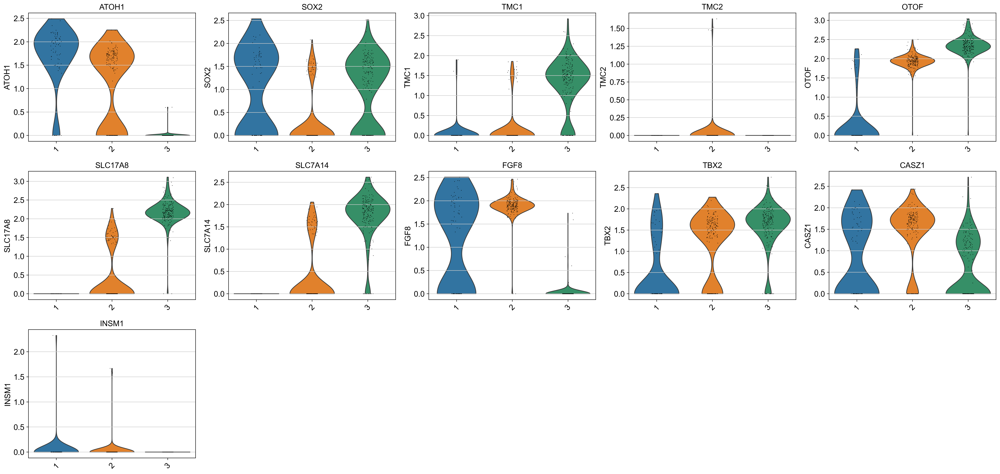

In [226]:
# Convert to categorical and specify the order if necessary
age_bins_order = sorted(adata_mouse_IHC.obs['devtime'].unique())
adata_mouse_IHC.obs['devtime'] = pd.Categorical(adata_mouse_IHC.obs['devtime'], categories=age_bins_order, ordered=True)

# Ensure 'age_bins2' is categorical
adata_mouse_IHC.obs['devtime'] = adata_mouse_IHC.obs['devtime'].astype('category')

# List of genes to plot
genes = ['ATOH1', 'SOX2', 
         'TMC1','TMC2',
          'OTOF','SLC17A8','SLC7A14','FGF8',
         'TBX2', 'CASZ1','INSM1']

# Create a figure with multiple subplots
n_genes = len(genes)
n_cols = 5  # Number of columns (subplots per row)
n_rows = (n_genes + n_cols - 1) // n_cols  # Calculate number of rows

fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows), squeeze=False)
axes = axes.flatten()  # Flatten the axes array for easy iteration

# Plot each gene in a separate subplot
for i, gene in enumerate(genes):
    ax = axes[i]
    sc.pl.violin(adata_mouse_IHC, gene, groupby='devtime', rotation=45, ax=ax, show=False)
    ax.set_title(gene)  # Set the title of each subplot to the gene name

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

meta NOT subset; don't know how to subset; dropped


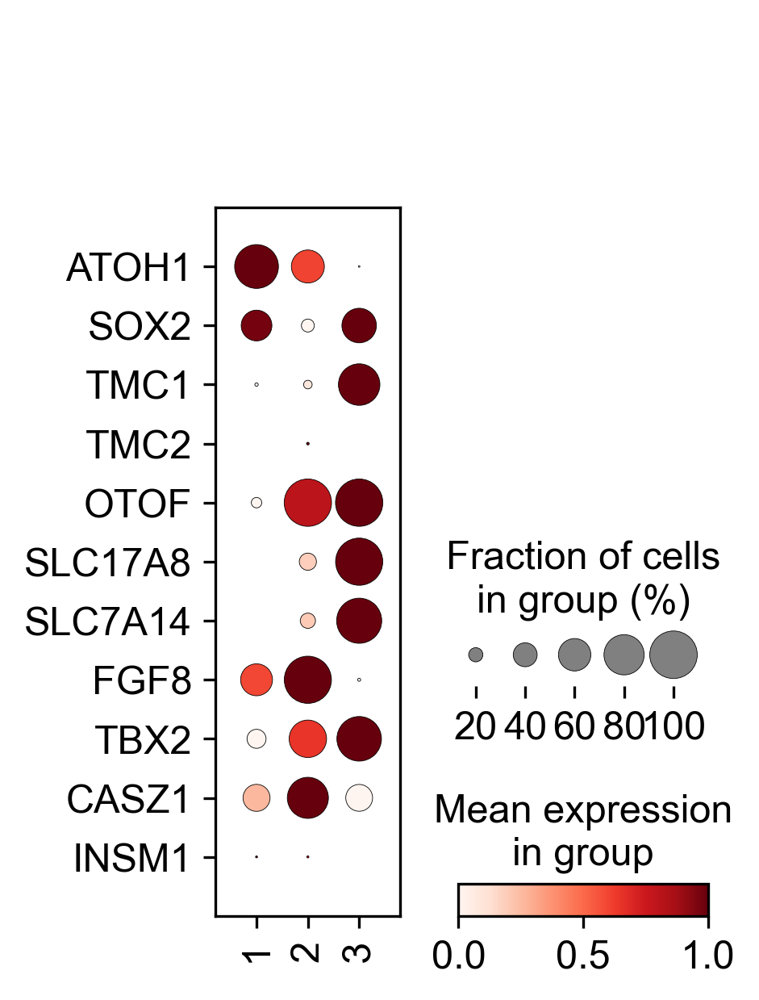

In [228]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.dotplot(adata_mouse_IHC, var_names=genes, groupby='devtime', swap_axes=True,
             save="_mouse_developmental_inner_hc2.pdf",standard_scale='var')#standard_scale='var'

In [240]:
adata_mouse_OHC=adata_mouse[adata_mouse.obs['subtype'].isin([ 'E16iHC','E14iHC','P1OHC','P7OHC','P14OHC','P28OHC' ])]
adata_mouse_OHC.obs['subtype'].value_counts()
adata_mouse_OHC.obs['timepoint'].value_counts()
adata_mouse_OHC_E14=adata_mouse_OHC[adata_mouse_OHC.obs['hc_type'].isin([ 'E14HC_proHC', ])]
adata_mouse_OHC_E14.obs['hc_type'].value_counts()
adata_mouse_OHC_E14.obs['timepoint'].value_counts()
adata_mouse_OHC_E14.obs['devtime']='1'
adata_mouse_OHC_E16=adata_mouse_OHC[adata_mouse_OHC.obs['hc_type'].isin([ 'E16HC_iOHC', ])]
adata_mouse_OHC_E16.obs['hc_type'].value_counts()
adata_mouse_OHC_E16.obs['timepoint'].value_counts()
adata_mouse_OHC_E16.obs['devtime']='1'
adata_mouse_OHC_P1=adata_mouse_OHC[adata_mouse_OHC.obs['hc_type'].isin([ 'P1HC_iOHC', ])]
adata_mouse_OHC_P1.obs['hc_type'].value_counts()
adata_mouse_OHC_P1.obs['timepoint'].value_counts()
adata_mouse_OHC_P1.obs['devtime']='2'
adata_mouse_OHC_P7=adata_mouse_OHC[adata_mouse_OHC.obs['hc_type'].isin([ 'P7HC_iOHC', ])]
adata_mouse_OHC_P7.obs['hc_type'].value_counts()
adata_mouse_OHC_P7.obs['timepoint'].value_counts()
adata_mouse_OHC_P7.obs['devtime']='2'
adata_mouse_OHC_P14=adata_mouse_OHC[adata_mouse_OHC.obs['hc_type'].isin([ 'P14HC_OHC', ])]
adata_mouse_OHC_P14.obs['hc_type'].value_counts()
adata_mouse_OHC_P14.obs['timepoint'].value_counts()
adata_mouse_OHC_P14.obs['devtime']='3'
adata_mouse_OHC_P28=adata_mouse_OHC[adata_mouse_OHC.obs['hc_type'].isin([ 'P28HC_OHC', ])]
adata_mouse_OHC_P28.obs['hc_type'].value_counts()
adata_mouse_OHC_P28.obs['timepoint'].value_counts()
adata_mouse_OHC_P28.obs['devtime']='3'

subtype
P28OHC    783
P1OHC     666
E16iHC    583
P14OHC    261
P7OHC     129
E14iHC     58
Name: count, dtype: int64

timepoint
P28HC    783
P1HC     666
E16HC    583
P14HC    261
P7HC     129
E14HC     58
Name: count, dtype: int64

hc_type
E14HC_proHC    58
Name: count, dtype: int64

timepoint
E14HC    58
Name: count, dtype: int64

hc_type
E16HC_iOHC    170
Name: count, dtype: int64

timepoint
E16HC    170
Name: count, dtype: int64

hc_type
P1HC_iOHC    217
Name: count, dtype: int64

timepoint
P1HC    217
Name: count, dtype: int64

hc_type
P7HC_iOHC    111
Name: count, dtype: int64

timepoint
P7HC    111
Name: count, dtype: int64

hc_type
P14HC_OHC    261
Name: count, dtype: int64

timepoint
P14HC    261
Name: count, dtype: int64

hc_type
P28HC_OHC    780
Name: count, dtype: int64

timepoint
P28HC    780
Name: count, dtype: int64

In [241]:
adata_mouse_OHC=adata_mouse_OHC_P28.concatenate(adata_mouse_OHC_P14,adata_mouse_OHC_P7,adata_mouse_OHC_P1,adata_mouse_OHC_E16,
                                                adata_mouse_OHC_E14
                                               )

In [242]:
sc.pp.normalize_total(adata_mouse_OHC, target_sum=1e4)
sc.pp.log1p(adata_mouse_OHC)

meta NOT subset; don't know how to subset; dropped


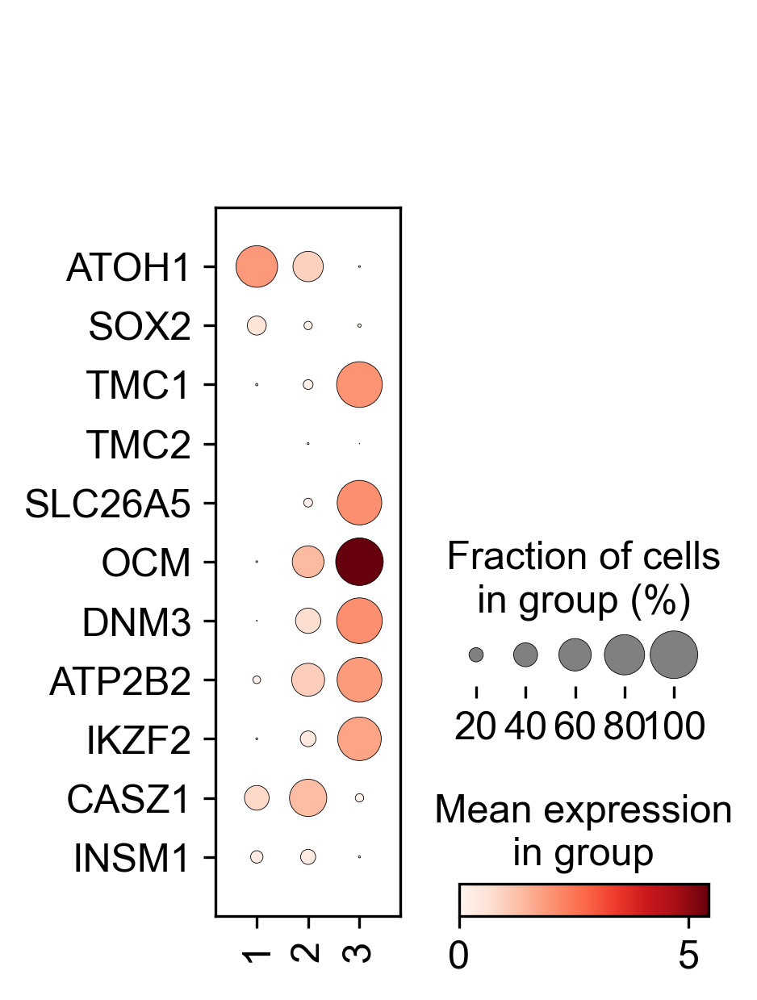

In [244]:
# Convert to categorical and specify the order if necessary
age_bins_order = sorted(adata_mouse_OHC.obs['devtime'].unique())
adata_mouse_OHC.obs['devtime'] = pd.Categorical(adata_mouse_OHC.obs['devtime'], categories=age_bins_order, ordered=True)

# Ensure 'age_bins2' is categorical
adata_mouse_OHC.obs['devtime'] = adata_mouse_OHC.obs['devtime'].astype('category')
genes2 = ['ATOH1', 'SOX2', 
         'TMC1','TMC2',
          'SLC26A5','OCM','DNM3','ATP2B2',
         'IKZF2', 'CASZ1','INSM1']
sc.pl.dotplot(adata_mouse_OHC, var_names=genes2, groupby='devtime',swap_axes=True,
             save="_mouse_developmental_outer_hc2.pdf",standard_scale='var')#standard_scale='var'

In [314]:
adata_mouse_OHC.obs['age_bins2']=adata_mouse_OHC.obs['devtime']
adata_mouse_OHC.obs['age_bins2'].value_counts()
adata_mouse_OHC.obs['devtime'].value_counts()

age_bins2
3    1041
2     328
1     228
Name: count, dtype: int64

devtime
3    1041
2     328
1     228
Name: count, dtype: int64

In [315]:
adata_mouse_IHC.obs['age_bins2']=adata_mouse_IHC.obs['devtime']
adata_mouse_IHC.obs['age_bins2'].value_counts()
adata_mouse_IHC.obs['devtime'].value_counts()

age_bins2
3    193
2    187
1     68
Name: count, dtype: int64

devtime
3    193
2    187
1     68
Name: count, dtype: int64

In [316]:
adata_mouse
adata_human

AnnData object with n_obs × n_vars = 2915 × 16823
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.hb', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.1', 'SCT_snn_res.0.2', 'SCT_snn_res.0.3', 'SCT_snn_res.0.4', 'SCT_snn_res.0.5', 'SCT_snn_res.0.6', 'SCT_snn_res.0.7', 'SCT_snn_res.0.8', 'SCT_snn_res.0.9', 'SCT_snn_res.1', 'SCT_snn_res.1.1', 'SCT_snn_res.1.2', 'SCT_snn_res.1.3', 'SCT_snn_res.1.4', 'SCT_snn_res.1.5', 'SCT_snn_res.1.6', 'seurat_clusters', 'timepoint', 'subtype', 'RNA_snn_res.0.5', 'hctype', 'hc_type', 'RNA_snn_res.0.8'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'
    uns: 'hctype_colors', 'hc_type_colors'
    obsm: 'X_pca', 'X_umap'
    layers: 'counts'

AnnData object with n_obs × n_vars = 203 × 16569
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'sample_id2', 'donor', 'gw', 'gender', 'sequencing', 'dataset', 'percent_mito', 'n_counts', 'leiden_R', 'cell_type_final', 'cell_type_final_v4', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet_scrub', 'X_scvi_batch', 'X_scvi_labels', 'age_bins', 'age_bins2', 'cellid', 'RNA_snn_res.0.8', 'seurat_clusters', 'species'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'
    uns: 'cell_type_final_v4_colors'
    obsm: 'X_pca', 'X_umap'
    layers: 'counts'

In [318]:
adata_mouse_v2=adata_mouse_OHC.concatenate(adata_mouse_IHC)
adata_mouse_v2

AnnData object with n_obs × n_vars = 2045 × 16823
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.hb', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.1', 'SCT_snn_res.0.2', 'SCT_snn_res.0.3', 'SCT_snn_res.0.4', 'SCT_snn_res.0.5', 'SCT_snn_res.0.6', 'SCT_snn_res.0.7', 'SCT_snn_res.0.8', 'SCT_snn_res.0.9', 'SCT_snn_res.1', 'SCT_snn_res.1.1', 'SCT_snn_res.1.2', 'SCT_snn_res.1.3', 'SCT_snn_res.1.4', 'SCT_snn_res.1.5', 'SCT_snn_res.1.6', 'seurat_clusters', 'timepoint', 'subtype', 'RNA_snn_res.0.5', 'hctype', 'hc_type', 'RNA_snn_res.0.8', 'devtime', 'batch', 'species', 'age_bins2'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'
    obsm: 'X_pca', 'X_umap'
    layers: 'counts'

In [319]:
adata_mouse_v2.obs['hc_type'].value_counts()

hc_type
P28HC_OHC      780
P14HC_OHC      261
P1HC_iOHC      217
E16HC_iOHC     170
P28HC_IHC      160
P1HC_iIHC      126
E14HC_proHC    116
P7HC_iOHC      111
P7HC_iIHC       61
P14HC_IHC       33
E16HC_iIHC      10
Name: count, dtype: int64

In [320]:
adata_mouse_v2.obs['age_bins2']=adata_mouse_v2.obs['devtime']
adata_mouse_v2.obs['age_bins2'].value_counts()
adata_mouse_v2.obs['devtime'].value_counts()

age_bins2
3    1234
2     515
1     296
Name: count, dtype: int64

devtime
3    1234
2     515
1     296
Name: count, dtype: int64

In [321]:
adata_mouse_v2.X.data

array([1.36928841, 1.36928841, 2.54397754, ..., 2.07744584, 2.08931908, 1.60432994])

In [322]:
adata_human.X.data

array([0.97267383, 1.04485226, 0.87939572, ..., 1.18815493, 0.80105847, 1.12643374])

In [335]:
adata_mouse_v2.obs['hc_type'].value_counts()

hc_type
P28HC_OHC      780
P14HC_OHC      261
P1HC_iOHC      217
E16HC_iOHC     170
P28HC_IHC      160
P1HC_iIHC      126
E14HC_proHC    116
P7HC_iOHC      111
P7HC_iIHC       61
P14HC_IHC       33
E16HC_iIHC      10
Name: count, dtype: int64

In [336]:
adata_mouse_v2_OHC=adata_mouse_v2[adata_mouse_v2.obs['hc_type'].isin([ 'P28HC_OHC','P14HC_OHC','P1HC_iOHC','E14HC_proHC','P7HC_iOHC','E16HC_iOHC' ])]
adata_mouse_v2_OHC.obs['hc_type'].value_counts()
adata_mouse_v2_OHC.obs['timepoint'].value_counts()
adata_mouse_v2_OHC.obs['age_bins2'].value_counts()
adata_mouse_v2_IHC=adata_mouse_v2[adata_mouse_v2.obs['hc_type'].isin([ 'P28HC_IHC','P1HC_iIHC','E14HC_proHC','P7HC_iIHC','P14HC_IHC','E16HC_iIHC' ])]
adata_mouse_v2_IHC.obs['hc_type'].value_counts()
adata_mouse_v2_IHC.obs['timepoint'].value_counts()
adata_mouse_v2_IHC.obs['age_bins2'].value_counts()

hc_type
P28HC_OHC      780
P14HC_OHC      261
P1HC_iOHC      217
E16HC_iOHC     170
E14HC_proHC    116
P7HC_iOHC      111
Name: count, dtype: int64

timepoint
P28HC    780
P14HC    261
P1HC     217
E16HC    170
E14HC    116
P7HC     111
Name: count, dtype: int64

age_bins2
3    1041
2     328
1     286
Name: count, dtype: int64

hc_type
P28HC_IHC      160
P1HC_iIHC      126
E14HC_proHC    116
P7HC_iIHC       61
P14HC_IHC       33
E16HC_iIHC      10
Name: count, dtype: int64

timepoint
P28HC    160
P1HC     126
E14HC    116
P7HC      61
P14HC     33
E16HC     10
Name: count, dtype: int64

age_bins2
3    193
2    187
1    126
Name: count, dtype: int64

In [338]:
adata_human_OHC.obs['cell_type_final_v4'].value_counts()
adata_human_OHC.obs['gw'].value_counts()
adata_human_OHC.obs['age_bins2'].value_counts()
adata_human_IHC.obs['cell_type_final_v4'].value_counts()
adata_human_IHC.obs['gw'].value_counts()
adata_human_IHC.obs['age_bins2'].value_counts()

cell_type_final_v4
Outer_HC    94
Name: count, dtype: int64

gw
14    41
23    25
17    14
16    10
15     3
22     1
Name: count, dtype: int64

age_bins2
1    54
3    26
2    14
Name: count, dtype: int64

cell_type_final_v4
Inner_HC    109
Name: count, dtype: int64

gw
14    48
16    23
17    17
15    14
23     5
18     2
Name: count, dtype: int64

age_bins2
1    85
2    19
3     5
Name: count, dtype: int64

In [339]:
#export human and mouse inner or outer hair cells for Jaccard index-based transcriptional similarity analysis

adata_human_OHC.write_loom(data_dir + 'adata_human_OHC.loom')
adata_human_OHC.obs.to_csv(data_dir +'adata_human_OHC_obs.csv')
adata_human_OHC.var.to_csv(data_dir +'adata_human_OHC_var.csv')
adata_human_IHC.write_loom(data_dir + 'adata_human_IHC.loom')
adata_human_IHC.obs.to_csv(data_dir +'adata_human_IHC_obs.csv')
adata_human_IHC.var.to_csv(data_dir +'adata_human_IHC_var.csv')

The loom file will lack these fields:
{'X_umap', 'X_pca'}
Use write_obsm_varm=True to export multi-dimensional annotations
The loom file will lack these fields:
{'X_umap', 'X_pca'}
Use write_obsm_varm=True to export multi-dimensional annotations


In [340]:
#export human and mouse inner or outer hair cells for Jaccard index-based transcriptional similarity analysis

adata_mouse_v2_OHC.write_loom(data_dir + 'adata_mouse_v2_OHC.loom')
adata_mouse_v2_OHC.obs.to_csv(data_dir +'adata_mouse_v2_OHC_obs.csv')
adata_mouse_v2_OHC.var.to_csv(data_dir +'adata_mouse_v2_OHC_var.csv')
adata_mouse_v2_IHC.write_loom(data_dir + 'adata_mouse_v2_IHC.loom')
adata_mouse_v2_IHC.obs.to_csv(data_dir +'adata_mouse_v2_IHC_obs.csv')
adata_mouse_v2_IHC.var.to_csv(data_dir +'adata_mouse_v2_IHC_var.csv')

The loom file will lack these fields:
{'X_umap', 'X_pca'}
Use write_obsm_varm=True to export multi-dimensional annotations
The loom file will lack these fields:
{'X_umap', 'X_pca'}
Use write_obsm_varm=True to export multi-dimensional annotations


In [341]:
#MECHINE LEARNING svm MODEL FOR ACCESSING THE PROPABILITY OF human CELL TYPE TRANSFER TO MANUALT ANNOTATED MOUSE CELL TYPE
import os 
import sys
import datetime
import numpy
import pandas
import scanpy 
import anndata
import scipy 
import matplotlib.pyplot
import functools
import random
import itertools
import warnings
import argparse
import seaborn

In [342]:
# Required libraries regardless of the model you choose

from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, classification_report
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline

In [343]:
# Library for Logistic Regression
from sklearn.linear_model import LogisticRegression

# Library for Random Forest 
from sklearn.ensemble import RandomForestClassifier

# Library for Support Vector Machine 
from sklearn.svm import SVC

#Suppress lots of memory warning
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3' 
from os.path import expanduser as eu
from os import path

scanpy.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)

from itertools import chain

In [375]:
def preprocessing_training(adata, hvgs):
    # Per cell normalization
    sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
    # Log transformation 
    sc.pp.log1p(adata)
    # Filter HVGs --> Select top N highly variable genes that will serve as features to the machine learning models  
    sc.pp.highly_variable_genes(adata, n_top_genes = hvgs)
    highly_variable_genes = adata.var["highly_variable"]
    adata = adata[:, highly_variable_genes]
    # Scale
    sc.pp.scale(adata, max_value=10)
    return adata

def preprocessing_testing(adata, hvgs): 
    # Per cell normalization
    sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
    # Log transformation 
    sc.pp.log1p(adata)
    # Use the HVGs that were selected for the training set 
    adata = adata[:, hvgs]
    # Scale
    sc.pp.scale(adata, max_value=10)
    return adata

In [511]:
adata = anndata.concat([adata_mouse_v2_OHC, adata_human_OHC])
adata

AnnData object with n_obs × n_vars = 1749 × 16139
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'seurat_clusters', 'RNA_snn_res.0.8', 'batch', 'species', 'age_bins2'
    obsm: 'X_pca', 'X_umap'
    layers: 'counts'

In [512]:
adata_human2= adata[adata.obs['species'].isin(['human']), :]
adata_human2
adata_mouse2= adata[adata.obs['species'].isin(['mouse']), :]
adata_mouse2

View of AnnData object with n_obs × n_vars = 94 × 16139
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'seurat_clusters', 'RNA_snn_res.0.8', 'batch', 'species', 'age_bins2'
    obsm: 'X_pca', 'X_umap'
    layers: 'counts'

View of AnnData object with n_obs × n_vars = 1655 × 16139
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'seurat_clusters', 'RNA_snn_res.0.8', 'batch', 'species', 'age_bins2'
    obsm: 'X_pca', 'X_umap'
    layers: 'counts'

In [513]:
X_df = pd.DataFrame(adata_mouse2.X.toarray(), index = adata_mouse2.obs_names, columns = adata_mouse2.var_names) 
# Fetching the count matrix to use as input to the model 
print(type(X_df), X_df.shape)

<class 'pandas.core.frame.DataFrame'> (1655, 16139)


In [514]:
# Labels we want to predict 
y = list(adata_mouse2.obs['age_bins2'].astype('str'))
print('List of unique labels we wish to transfer: {}'.format(numpy.unique(y)))

List of unique labels we wish to transfer: ['1' '2' '3']


In [515]:
# Split the training dataset into train and test sets 
X_train, X_test, y_train, y_test = train_test_split(
        X_df,
        y,
        test_size=0.3, # This can be changed, though it makes sense to use 25-30% of the data for test
        random_state=1234,
    )

X_train_indices = X_train.index.to_list()
X_test_indices = X_test.index.to_list()
X_train = preprocessing_training(adata_mouse2[X_train_indices, :], 1500)#n_hvgs 1000

hvgs_X_train = X_train.var_names.to_list()
X_test = preprocessing_testing(adata_mouse2[X_test_indices, :], hvgs_X_train)

X_train = X_train.X
X_test = X_test.X

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added
    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added
    'n_counts', counts per cell before normalization (adata.obs)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [516]:
# Train supervised learning models #
# Compute smoothing class weights 
def class_weight(labels_dict,mu=0.15):
    total = numpy.sum(list(labels_dict.values()))
    keys = labels_dict.keys()
    weight = {}
    print(total)

    for i in keys:
        score = numpy.log(mu*total/float(labels_dict[i]))
        weight[i] = score if score > 1 else 1
    return weight

labels_dict = {}
for i in y_train:
    labels_dict[i] = labels_dict.get(i, 0) + 1

print(labels_dict)
weights = class_weight(labels_dict)

{'2': 224, '3': 726, '1': 208}
1158


In [517]:
weights

{'2': 1, '3': 1, '1': 1}

In [518]:
labels_dict

{'2': 224, '3': 726, '1': 208}

In [519]:
#Training a Support Vector Machine multiclass classifier
svm = SVC(kernel = "rbf", probability = True, class_weight = weights)

In [520]:
pca = PCA()
pca

PCA()

In [521]:
pipe = Pipeline(steps=[('pca', pca), ('SVC', svm)])
print('Starting hyperparameter tuning with exhaustive grid search')

Starting hyperparameter tuning with exhaustive grid search


In [522]:
# Choose a grid of hyperparameters values (these are arbitrary but reasonable as I took reference values from the documentation)
params_svm = {'SVC__C':[0.1, 1, 10, 100], 'SVC__gamma':[0.001, 0.01, 0.1], 'pca__n_components': [0.7, 0.8, 0.9]}

In [523]:
# Use grid search cross validation to span the hyperparameter space and choose the best 
grid = GridSearchCV(pipe, param_grid = params_svm, cv=5, verbose =1, n_jobs = -1)
grid

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('pca', PCA()),
                                       ('SVC',
                                        SVC(class_weight={'1': 1, '2': 1,
                                                          '3': 1},
                                            probability=True))]),
             n_jobs=-1,
             param_grid={'SVC__C': [0.1, 1, 10, 100],
                         'SVC__gamma': [0.001, 0.01, 0.1],
                         'pca__n_components': [0.7, 0.8, 0.9]},
             verbose=1)

In [524]:
# Fit the model to the training set of the training data
grid.fit(X_train, y_train)

Fitting 5 folds for each of 36 candidates, totalling 180 fits


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('pca', PCA()),
                                       ('SVC',
                                        SVC(class_weight={'1': 1, '2': 1,
                                                          '3': 1},
                                            probability=True))]),
             n_jobs=-1,
             param_grid={'SVC__C': [0.1, 1, 10, 100],
                         'SVC__gamma': [0.001, 0.01, 0.1],
                         'pca__n_components': [0.7, 0.8, 0.9]},
             verbose=1)

In [525]:
# Evaluate supervised learning models #
predicted_labels = grid.best_estimator_.predict(X_test) 
report = classification_report(y_test, predicted_labels)
print("Accuracy:", accuracy_score(y_test, predicted_labels))
print(report)

Accuracy: 0.9054325955734407
              precision    recall  f1-score   support

           1       1.00      0.40      0.57        78
           2       0.69      1.00      0.82       104
           3       1.00      1.00      1.00       315

    accuracy                           0.91       497
   macro avg       0.90      0.80      0.79       497
weighted avg       0.93      0.91      0.89       497



([<matplotlib.axis.XTick at 0x16f826d89d0>,
 [Text(0, 0, '0'), Text(1, 0, '1')])

([<matplotlib.axis.YTick at 0x16f826da050>,
 [Text(0, 0, '0'), Text(0, 1, '1')])

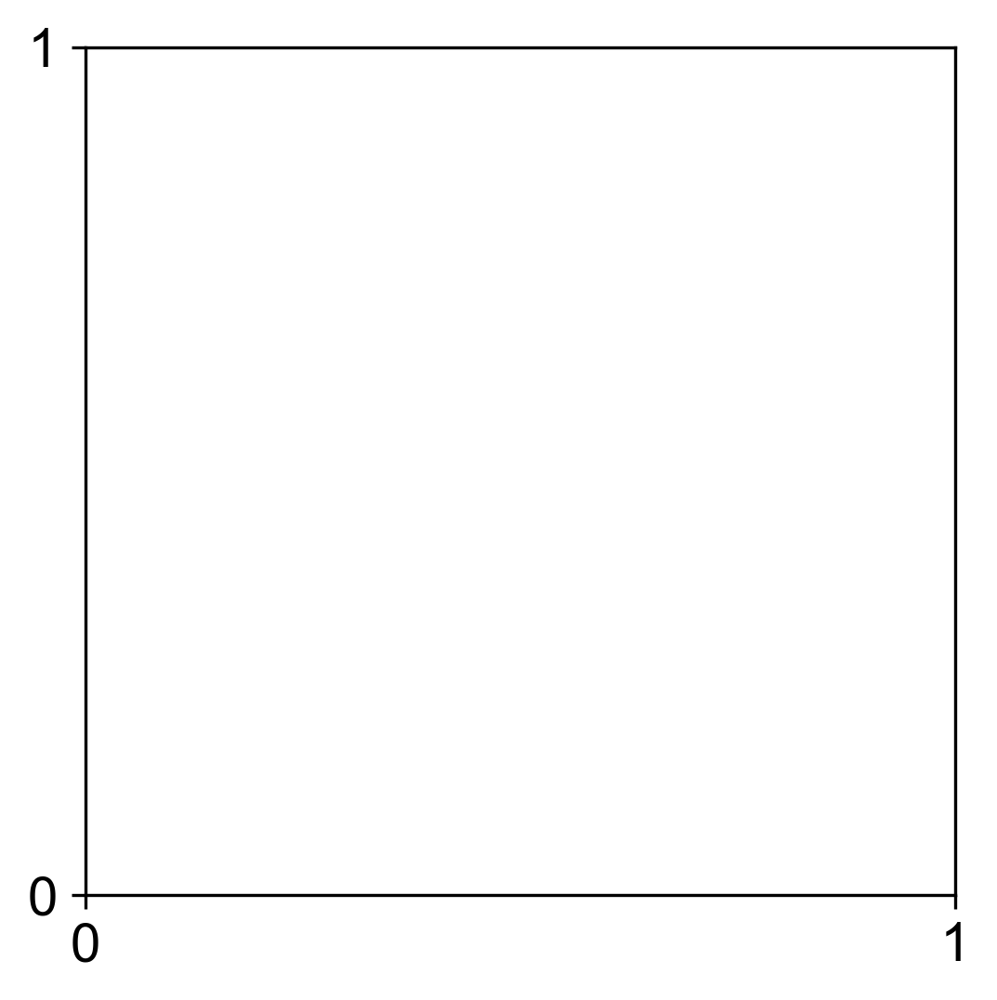

In [526]:
# Confusion matrix 
cnf_matrix = confusion_matrix(y_test, predicted_labels)

class_names=[0,1] # name  of classes
fig, ax = matplotlib.pyplot.subplots()
tick_marks = numpy.arange(len(class_names))
matplotlib.pyplot.xticks(tick_marks, class_names)
matplotlib.pyplot.yticks(tick_marks, class_names)

<AxesSubplot: >

Text(0.5, 1.1, 'Confusion matrix')

Text(57.083333333333336, 0.5, 'Actual label')

Text(0.5, 39.08333333333335, 'Predicted label')

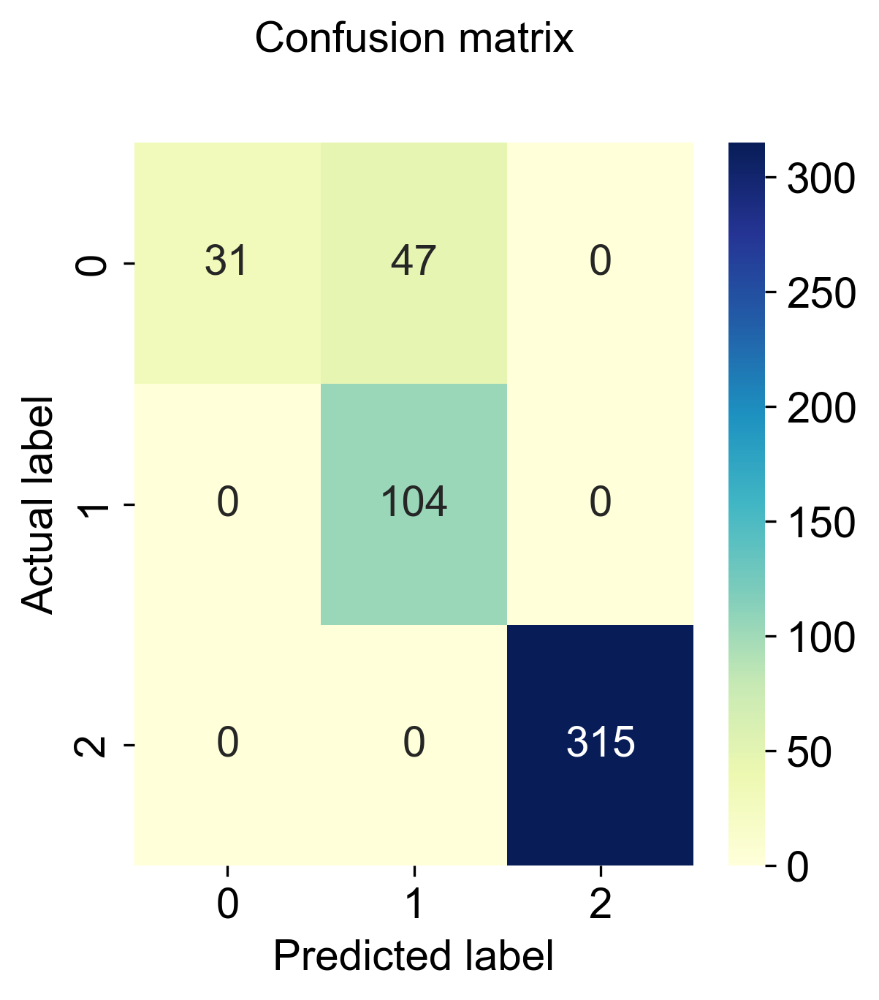

In [527]:
# create heatmap
seaborn.heatmap(pandas.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
matplotlib.pyplot.tight_layout()
matplotlib.pyplot.title('Confusion matrix', y=1.1)
matplotlib.pyplot.ylabel('Actual label')
matplotlib.pyplot.xlabel('Predicted label')

In [528]:
# Transfer labels #
###################

grid.best_estimator_.feature_names = hvgs_X_train

def process_and_subset_data(adata, genes):
    # save the log transformed counts as raw 
    adata.raw = adata.copy()
    # Per cell normalization
    sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
    # Log transformation 
    sc.pp.log1p(adata)
    # Subset data
    adata = adata[:, list(genes)]
    # Scale
    sc.pp.scale(adata, max_value=10)
    return adata

def make_single_predictions(adata, classifier): 
    #if scipy.sparse.issparse(adata.X):
        #adata.X = adata.X.toarray()
    adata_X = numpy.array(adata.X)
    print(type(adata_X), adata_X.shape)
    adata_preds = classifier.predict(adata_X)
    adata.obs['classifier'] = adata_preds
    print(adata.obs.classifier.value_counts(dropna = False))
    
def make_correspondence(classifier):
    corr = {}
    for i in range(0,len(classifier.classes_)):
            corr[i] = classifier.classes_[i]
    return corr

def make_probability_predictions(adata, classifier):
    adata_X = numpy.array(adata.X)
    print(type(adata_X), adata_X.shape)
    proba_preds = classifier.predict_proba(adata_X)
    df_probs = pd.DataFrame(numpy.column_stack(list(zip(*proba_preds))))
    corr = make_correspondence(classifier)
    for index in df_probs.columns.values:
        celltype = corr[index]
        adata.obs['prob_'+celltype] = df_probs[index].to_list()

In [529]:
adata_human2 = process_and_subset_data(adata_human2, grid.best_estimator_.feature_names)
make_single_predictions(adata_human2, grid.best_estimator_)
make_probability_predictions(adata_human2, grid.best_estimator_)

to_save = ['classifier']
for i in adata_human2.obs.columns:
    if i.startswith('prob_'):
        to_save.append(i)

print('Saving the following obs: {}'.format(to_save))

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added
    'n_counts', counts per cell before normalization (adata.obs)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
<class 'numpy.ndarray'> (94, 1500)
classifier
3    80
2    14
Name: count, dtype: int64
<class 'numpy.ndarray'> (94, 1500)
Saving the following obs: ['classifier', 'prob_1', 'prob_2', 'prob_3']


In [530]:
# Save transferred labels #
adata_human2.obs[to_save].to_csv('transferred_labels_svm_ohc_1500hvgs.csv')#CHANGE OHC IHC,RESPECTIVELY
#this csv formated-result then is as input as box-plot visualization in graphpad.